<div class="usecase-title">Analyzing and Forecasting Tree Canopy Loss in the City of Melbourne</div>

<div class="usecase-authors"><b>Authored by: </b> Samiha Haque</div>

<div class="usecase-duration"><b>Duration:</b> 90 mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>Advanced</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b>Python, GeoDataFrames, Regression models, Neural Networks, Weighted least squares, Cook's distance, Folium Maps.</div>
</div>

<div class="usecase-section-header">Scenario</div>

As a governor of the City of Melbourne, I want to analyze and predict changes in tree canopy, so that I can forecast future canopy loss over the next two years if no new trees are planted. By comparing these predictions with the Urban Forest Strategy's tree planting zone schedules, I aim to assess and enhance the effectiveness of the planting schedules, ensuring sustainable urban forestry and improving the city's green spaces.


<div class="usecase-section-header">What this use case will teach you</div>

At the end of this use case you will:
- Learn to work with GeoDataFrames, geometries and geo shapes.
- Learn pre-processing techniques such as fixing skewness, standardizing and normalizing.
- Learn to apply Regression models: Linear Regression, Random Forest Model, Support Vector Regression, Gradient Boosting Regression, RANSAC, Huber Regression, Polynomial Regression.
- Learn to analyze residual plots.
- Learn to build basic neural network model.
- Learn to use Weighted Least Squares method
- Learn to use Cook's distance to identify and filter out influential points
- Learn to plot multiple geolocations on a map using folium.
- Learn to display multiple maps on different tabs using folium.

<div class="usecase-section-header"><b>Urban Canopy Preservation: Leveraging Predictive Modeling to Support Melbourne's Tree Planting Strategy and SDG 'Life on Land'<b></div>

One of the 16 Sustainable Development Goals (SDGs) is "Life on Land," which aims to "protect, restore, and promote the sustainable use of terrestrial ecosystems, sustainably manage forests, combat desertification, halt and reverse land degradation, and stop biodiversity loss." In alignment with this goal, the City of Melbourne seeks to promote sustainable forest management through urban greening and afforestation. This use case focuses on identifying areas where tree canopies have been lost over time to support this objective.

The primary goal of the analysis was to detect locations experiencing tree canopy loss. Data from 2018 and 2019 was used to predict canopy loss in 2021, and subsequently, data from 2019 and 2021 was utilized to forecast potential loss in 2023. Since data for 2023 is not available, I built the model using 2021 values, assuming similar trends or patterns would continue. The emphasis was on identifying areas with a decline in canopy coverage to assess which locations would continue to lose tree cover if no new trees were planted. I then cross-referenced this information with Melbourne's tree planting zones and schedules to identify areas that the City of Melbourne may be overlooking but where tree planting is crucial due to canopy decline.

Initially, I experimented with several regression techniques, including Linear Regression, Random Forest Model, Support Vector Regression, Gradient Boosting Regression, RANSAC, Huber Regression, and Polynomial Regression. However, all these models displayed funnel-shaped residual plots, indicating heteroscedasticity. I then turned to a neural network model, but it produced similar results. Eventually, I opted for a weighted least squares (WLS) method and applied Cook's distance to remove influential points, which improved the model's performance. This final model was then used to predict tree canopy loss in 2023.


<div class="usecase-section-header"><b>Datasets used</b></div>

- [Tree Canopies 2016 (Urban Forest)
](https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2016-urban-forest/information/)<br>
The 2016 tree canopy data, mapped using aerial photos and LiDAR, served as a baseline to compare canopy changes over time, helping to identify areas with significant canopy loss. It mainly contains geopoint, geoshape and area. This dataset is imported from Melbourne Open Data website, using API V2.1.</p>

- [Tree canopies 2018 entire municipal area (Urban Forest)
](https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2018-entire-municipal-area-urban-forest/information/)<br>
This dataset contains the geopoint, geoshape, objectid, shape length and shape area. This dataset is imported from Melbourne Open Data website, using API V2.1.

- [Tree canopies 2019)
](https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2019/information/)<br>
This dataset contains the geopoint, geoshape and id. The 2019 dataset contains spatial polygons representing tree canopy areas across the City of Melbourne, which can be mapped using the geometry column. It was used to track canopy changes by comparing it with other years and to predict future canopy loss trends. This dataset is imported from Melbourne Open Data website, using API V2.1.

- [Tree Canopies 2021 (Urban Forest))](https://data.melbourne.vic.gov.au/explore/dataset/tree-canopies-2021-urban-forest/information/)<br>
This dataset contains the geopoint and geoshape. The 2021 dataset maps tree canopy within the City of Melbourne using high-resolution multi-spectral imagery. The canopy polygons represent actual tree canopy extents on both private and public properties across the city. It was used to assess recent changes in tree canopy and forecast future loss by comparing it with previous years, such as 2018 and 2019. This dataset is imported from Melbourne Open Data website, using API V2.1.

- [Tree planting zone schedules, with years (Urban Forest)
](https://data.melbourne.vic.gov.au/explore/dataset/tree-planting-zone-schedules-with-years-urban-forest/information/)<br>
This dataset mainly contains the geopoint, geoshape and planting schedules. This dataset outlines the anticipated tree planting schedules across the City of Melbourne, providing a provisional timeframe for planting in each street. It was used to compare areas of tree canopy loss with scheduled planting zones, identifying locations that may need priority due to a decrease in canopy coverage, even if they are currently overlooked in the plan. This dataset is imported from Melbourne Open Data website, using API V2.1.

In [42]:
import requests
import pandas as pd
import numpy as np
from io import StringIO
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import shape
import folium
from IPython.display import display, HTML
from geopy.geocoders import Nominatim
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import HuberRegressor
from sklearn.linear_model import RANSACRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import make_scorer, mean_absolute_error, r2_score,mean_squared_error
import tensorflow as tf
from statsmodels.stats.outliers_influence import OLSInfluence
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense 
from tensorflow.keras.optimizers import Adadelta
from keras.callbacks import EarlyStopping
import tensorflow.keras.backend as K
import statsmodels.api as sm

In [2]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='tree-canopies-2016-urban-forest'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    canopy_2016=pd.read_csv(StringIO(url_content),delimiter=';')
else:
    print(f'Request failed with status code {response.status_code}')

In [3]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='tree-canopies-2018-entire-municipal-area-urban-forest'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    canopy_2018=pd.read_csv(StringIO(url_content),delimiter=';')
    print(canopy_2018.head(10))

else:
    print(f'Request failed with status code {response.status_code}')

                              geo_point_2d  \
0   -37.84602285495841, 144.97924782873844   
1   -37.845962192617044, 144.9799793892225   
2   -37.84588630574396, 144.98021376931501   
3  -37.845852004062884, 144.98487772492962   
4    -37.84319818316156, 144.9031046911688   
5   -37.84573243353317, 144.98060993453439   
6  -37.845787857069794, 144.98469142233296   
7  -37.845767803351194, 144.98456044006682   
8   -37.845759265667134, 144.9847978689059   
9  -37.845659321213056, 144.97986343165596   

                                           geo_shape  objectid  shape_leng  \
0  {"coordinates": [[[[144.97925092251597, -37.84...       485   46.817501   
1  {"coordinates": [[[[144.98008850396891, -37.84...       491   59.992940   
2  {"coordinates": [[[[144.98022149936796, -37.84...       493    6.815275   
3  {"coordinates": [[[[144.98488143894568, -37.84...       501    9.021635   
4  {"coordinates": [[[[144.9031086928607, -37.843...       660    6.921479   
5  {"coordinates": [[[[14

In [4]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='tree-canopies-2019'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    canopy_2019=pd.read_csv(StringIO(url_content),delimiter=';')
    print(canopy_2019.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

                              geo_point_2d  \
0  -37.806939661373356, 144.94525884712138   
1   -37.80696249351158, 144.94871645633398   
2   -37.80695305356777, 144.94666702574662   
3   -37.80686661161844, 144.94324549515883   
4   -37.80676649515245, 144.93740058973637   
5   -37.80728115533656, 144.96583090095476   
6    -37.80677399539525, 144.9368268115774   
7     -37.8072147454235, 144.9623418560369   
8   -37.80736894582776, 144.97144239399995   
9  -37.807246670404545, 144.96473046094926   

                                           geo_shape     id  
0  {"coordinates": [[[144.945262941, -37.80694305...  60528  
1  {"coordinates": [[[144.948703227, -37.80698951...  60513  
2  {"coordinates": [[[144.9466682286, -37.8069540...  60512  
3  {"coordinates": [[[144.943239676, -37.80689421...  60511  
4  {"coordinates": [[[144.9374100872, -37.8067899...  60510  
5  {"coordinates": [[[144.9658321041, -37.8072821...  60508  
6  {"coordinates": [[[144.9368256089, -37.8067729...  60503

In [5]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='tree-canopies-2021-urban-forest'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    canopy_2021=pd.read_csv(StringIO(url_content),delimiter=';')
    print(canopy_2021.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

                              geo_point_2d  \
0   -37.77506304683423, 144.93898465421296   
1  -37.775132956993566, 144.93979253397976   
2   -37.77515941768105, 144.93986878938023   
3   -37.775130649990984, 144.9389679196713   
4   -37.77518700935825, 144.93875479828375   
5    -37.77519588721749, 144.9400498374677   
6     -37.77523198796972, 144.939139783017   
7     -37.7877402517759, 144.9630187754576   
8   -37.77531133181187, 144.93995080107067   
9   -37.78099284465387, 144.91549621280674   

                                           geo_shape  
0  {"coordinates": [[[[144.9389624164712, -37.775...  
1  {"coordinates": [[[[144.93978541786475, -37.77...  
2  {"coordinates": [[[[144.93986368038625, -37.77...  
3  {"coordinates": [[[[144.93894119058956, -37.77...  
4  {"coordinates": [[[[144.93877858274755, -37.77...  
5  {"coordinates": [[[[144.94001353302923, -37.77...  
6  {"coordinates": [[[[144.93913191868984, -37.77...  
7  {"coordinates": [[[[144.96296951252782, -37.78... 

In [6]:
base_url='https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
dataset_id='tree-planting-zone-schedules-with-years-urban-forest'


url=f'{base_url}{dataset_id}/exports/csv'
params={'select':'*','limit':-1,'lang':'en','timezone':'UTC'}

response=requests.get(url,params=params)

if response.status_code==200:
    url_content=response.content.decode('utf-8')
    zones=pd.read_csv(StringIO(url_content),delimiter=';')
    print(zones.head(10))
else:
    print(f'Request failed with status code {response.status_code}')

                              geo_point_2d  \
0    -37.8030612625994, 144.96879535330316   
1    -37.81979235869452, 144.9675112730786   
2  -37.796602429685905, 144.96990674715127   
3    -37.79774465832566, 144.9502620746376   
4    -37.81652483951976, 144.9864951838192   
5   -37.80052529463123, 144.97301577291447   
6   -37.80320423406633, 144.96274342342963   
7   -37.80458396557453, 144.95387035874043   
8    -37.80577394795748, 144.9645540416368   
9    -37.79087369913382, 144.9301190541952   

                                           geo_shape  str_from  segpart  \
0  {"coordinates": [[[[144.969387175266, -37.8029...       NaN      NaN   
1  {"coordinates": [[[[144.96828098035, -37.81969...       NaN      NaN   
2  {"coordinates": [[[[144.969341164027, -37.7965...       NaN      NaN   
3  {"coordinates": [[[[144.950283591209, -37.7975...       NaN      NaN   
4  {"coordinates": [[[[144.986101797552, -37.8163...       NaN      NaN   
5  {"coordinates": [[[[144.97346041968, -37

In [7]:
canopy_2016.isna().sum()

geo_point_2d    0
geo_shape       0
area            0
dtype: int64

In [8]:
canopy_2018.isna().sum()

geo_point_2d    0
geo_shape       0
objectid        0
shape_leng      0
shape_area      0
dtype: int64

In [9]:
canopy_2021.head()

,geo_point_2d,geo_shape
0,"-37.77506304683423, 144.93898465421296","{""coordinates"": [[[[144.9389624164712, -37.775..."
1,"-37.775132956993566, 144.93979253397976","{""coordinates"": [[[[144.93978541786475, -37.77..."
2,"-37.77515941768105, 144.93986878938023","{""coordinates"": [[[[144.93986368038625, -37.77..."
3,"-37.775130649990984, 144.9389679196713","{""coordinates"": [[[[144.93894119058956, -37.77..."
4,"-37.77518700935825, 144.93875479828375","{""coordinates"": [[[[144.93877858274755, -37.77..."


In [10]:
canopy_2021.shape

(57980, 2)

In [11]:
canopy_2021.isna().sum()

geo_point_2d    0
geo_shape       0
dtype: int64

In [12]:
canopy_2019.head()

,geo_point_2d,geo_shape,id
0,"-37.806939661373356, 144.94525884712138","{""coordinates"": [[[144.945262941, -37.80694305...",60528
1,"-37.80696249351158, 144.94871645633398","{""coordinates"": [[[144.948703227, -37.80698951...",60513
2,"-37.80695305356777, 144.94666702574662","{""coordinates"": [[[144.9466682286, -37.8069540...",60512
3,"-37.80686661161844, 144.94324549515883","{""coordinates"": [[[144.943239676, -37.80689421...",60511
4,"-37.80676649515245, 144.93740058973637","{""coordinates"": [[[144.9374100872, -37.8067899...",60510


In [13]:
canopy_2019.shape

(114784, 3)

In [14]:
canopy_2019.isna().sum()

geo_point_2d    0
geo_shape       0
id              0
dtype: int64

## Calculating the geometry and setting up the crs

This section processes geospatial data representing tree canopy areas for the years 2016, 2018, 2019, and 2021. Initially, the code extracts geometric shapes from the data and creates GeoDataFrames for each year, ensuring that they are correctly set to the WGS84 coordinate reference system (EPSG:4326). The geometries are then transformed to the EPSG:28355 coordinate system to maintain consistency in spatial analysis. Subsequently, the area of each canopy geometry is calculated for each year. This approach is crucial as it allows for accurate comparisons of tree canopy changes over time, helping to understand trends in urban forestry and the impact of environmental policies.

In [15]:
canopy_2016['geometry_2016'] = canopy_2016['geo_shape'].apply(lambda x: shape(eval(x)))

In [16]:
gdf_2016 = gpd.GeoDataFrame(canopy_2016, geometry='geometry_2016')
gdf_2016.crs = 'EPSG:4326'

In [17]:
canopy_2018['geometry_2018'] = canopy_2018['geo_shape'].apply(lambda x: shape(eval(x)))

In [18]:
gdf_2018 = gpd.GeoDataFrame(canopy_2018, geometry='geometry_2018')


In [19]:
gdf_2018.crs = 'EPSG:4326'

In [20]:
canopy_2019['geometry_2019'] = canopy_2019['geo_shape'].apply(lambda x: shape(eval(x)))
canopy_2021['geometry_2021'] = canopy_2021['geo_shape'].apply(lambda x: shape(eval(x)))

In [21]:
gdf_2019 = gpd.GeoDataFrame(canopy_2019, geometry='geometry_2019')
gdf_2021 = gpd.GeoDataFrame(canopy_2021, geometry='geometry_2021')


In [22]:
gdf_2019.crs = 'EPSG:4326'
gdf_2021.crs = 'EPSG:4326'

In [23]:
gdf_2016['geometry_2016'] = gdf_2016['geometry_2016'].to_crs('EPSG:28355')

In [24]:
gdf_2018['geometry_2018'] = gdf_2018['geometry_2018'].to_crs('EPSG:28355')
gdf_2019['geometry_2019'] = gdf_2019['geometry_2019'].to_crs('EPSG:28355')
gdf_2021['geometry_2021'] = gdf_2021['geometry_2021'].to_crs('EPSG:28355')

In [25]:
gdf_2016['area_2016'] = gdf_2016.geometry.area

In [26]:
gdf_2018['area_2018'] = gdf_2018.geometry.area
gdf_2019['area_2019'] = gdf_2019.geometry.area
gdf_2021['area_2021'] = gdf_2021.geometry.area

## Creating the intersecting dataset
This section computes the intersections of the canopy geometries from the different years using 'overlay' function to identify common areas. This process helps in understanding how specific regions of the tree canopy have changed over time.

In [27]:
overlap_2018_2019 = gpd.overlay(gdf_2018, gdf_2019, how='intersection')

In [28]:
overlap_2018_2019_2021 = gpd.overlay(overlap_2018_2019, gdf_2021, how='intersection')

In [29]:
gdf_2016.columns=['geo_point_2016','geo_shape_2016','area','geometry_2016','area_2016']

In [30]:
overlap_2018_2019_2021_2016=gpd.overlay(overlap_2018_2019_2021, gdf_2016, how='intersection')

In [31]:
overlap_2018_2019_2021_2016.columns

Index(['geo_point_2d_1', 'geo_shape_1', 'objectid', 'shape_leng', 'shape_area',
       'area_2018', 'geo_point_2d_2', 'geo_shape_2', 'id', 'area_2019',
       'geo_point_2d', 'geo_shape', 'area_2021', 'geo_point_2016',
       'geo_shape_2016', 'area', 'area_2016', 'geometry'],
      dtype='object')

In the code, a dictionary called main_dict is created to store important information, including geographical points and area measurements for each overlapping section of tree canopy from 2018, 2019, 2021, and 2016. During the iteration over the intersections of the geometries, the code checks specific conditions: it ensures that the total area of the canopy in 2016 is greater than that in 2018, and that the areas continue to decrease from 2018 to 2021. This is crucial because the overlap function can produce fragmented geometries with the same ID, leading to potential discrepancies in area calculations. By summing the areas of these fragmented sections, the code verifies that the overall area associated with each ID actually reflects a decreasing trend over time. If the conditions are satisfied, the relevant data for each section is recorded in main_dict for further analysis. This meticulous approach allows for a more accurate assessment of tree canopy changes, which is vital for effective urban forestry management and environmental monitoring.

In [32]:
main_id_2019=[]
main_id_2018=[]
main_id_2021=[]
main_id_2016=[]
visited=[]
main_dict={'geo_point_2018':[], 'geo_shape_2018':[], 'id_2018':[],
       'area_2018':[], 'geo_point_2019':[], 'geo_shape_2019':[], 'id_2019':[], 'area_2019':[],
       'geo_point_2021':[], 'geo_shape_2021':[], 'area_2021':[], 'geometry':[],'geo_point_2016':[],'geo_shape_2016':[],'area_2016':[]}
for i,row in overlap_2018_2019_2021_2016.iterrows():
    
    id_2018=row['objectid']
    if id_2018 not in visited:
        visited.append(id_2018)
        geo_section=overlap_2018_2019_2021_2016.loc[overlap_2018_2019_2021_2016['objectid']==id_2018]
        lst_2019=[]
        sum_2019=0
        idx=[]
        for j,k in geo_section.iterrows():
            if k['id'] not in lst_2019:
                lst_2019.append(k['id'])
                sum_2019+=k['area_2019']
                idx.append(j)
        lst_2021=[]
        sum_2021=0
        for j,k in geo_section.iterrows():
            if k['geo_point_2d'] not in lst_2021:
                lst_2021.append(k['geo_point_2d'])
                sum_2021+=k['area_2021']
                idx.append(j)
        lst_2016=[]
        sum_2016=0
        for j,k in geo_section.iterrows():
            if k['geo_point_2016'] not in lst_2016:
                lst_2016.append(k['geo_point_2016'])
                sum_2016+=k['area_2016']
                idx.append(j)
        if sum_2016>row['area_2018'] and row['area_2018']>sum_2019 and sum_2019>sum_2021:
            main_id_2018.append(id_2018)
            main_id_2019.extend(lst_2019)
            main_id_2021.extend(lst_2021)
            main_id_2016.extend(lst_2016)
            main_dict['geo_point_2018'].append(overlap_2018_2019_2021_2016.iloc[j,0])
            main_dict['geo_shape_2018'].append(overlap_2018_2019_2021_2016.iloc[j,1])
            main_dict['id_2018'].append(overlap_2018_2019_2021_2016.iloc[j,2])
            main_dict['area_2018'].append(overlap_2018_2019_2021_2016.iloc[j,5])
            main_dict['geo_point_2019'].append(overlap_2018_2019_2021_2016.iloc[j,6])
            main_dict['geo_shape_2019'].append(overlap_2018_2019_2021_2016.iloc[j,7])
            main_dict['id_2019'].append(overlap_2018_2019_2021_2016.iloc[j,8])
            main_dict['area_2019'].append(overlap_2018_2019_2021_2016.iloc[j,9])
            main_dict['geo_point_2021'].append(overlap_2018_2019_2021_2016.iloc[j,10])
            main_dict['geo_shape_2021'].append(overlap_2018_2019_2021_2016.iloc[j,11])
            main_dict['area_2021'].append(overlap_2018_2019_2021_2016.iloc[j,12])
            main_dict['geometry'].append(overlap_2018_2019_2021_2016.iloc[j,17])
            main_dict['geo_point_2016'].append(overlap_2018_2019_2021_2016.iloc[j,13])
            main_dict['geo_shape_2016'].append(overlap_2018_2019_2021_2016.iloc[j,14])
            main_dict['area_2016'].append(overlap_2018_2019_2021_2016.iloc[j,16])

Finally, the code constructs a new GeoDataFrame 'gdf' and setting its coordinate reference systems to EPSG:4326. 

In [33]:
gdf=gpd.GeoDataFrame(main_dict, geometry='geometry')
gdf.crs='EPSG:4326'

The GeoDataFrames are filtered to retain only the entries that correspond to the identified overlapping sections stored in main_id_2018, main_id_2019, main_id_2021, and main_id_2016.

In [34]:
gdf_2018=gdf_2018.loc[gdf_2018['objectid'].isin(main_id_2018)]
gdf_2019=gdf_2019.loc[gdf_2019['id'].isin(main_id_2019)]
gdf_2021=gdf_2021.loc[gdf_2021['geo_point_2d'].isin(main_id_2021)]
gdf_2016=gdf_2016.loc[gdf_2016['geo_point_2016'].isin(main_id_2016)]

In [35]:
gdf_2018['geometry_2018'] = gdf_2018['geometry_2018'].to_crs('EPSG:4326')
gdf_2019['geometry_2019'] = gdf_2019['geometry_2019'].to_crs('EPSG:4326')
gdf_2021['geometry_2021'] = gdf_2021['geometry_2021'].to_crs('EPSG:4326')
gdf_2016['geometry_2016'] = gdf_2016['geometry_2016'].to_crs('EPSG:4326')


In [36]:
gdf.head(3)

,geo_point_2018,geo_shape_2018,id_2018,area_2018,geo_point_2019,geo_shape_2019,id_2019,area_2019,geo_point_2021,geo_shape_2021,area_2021,geometry,geo_point_2016,geo_shape_2016,area_2016
0,"-37.84484005800719, 144.9799763642485","{""coordinates"": [[[[144.9799995022198, -37.844...",619,49.275435,"-37.84483829849872, 144.9799805672743","{""coordinates"": [[[144.9799850896, -37.8448682...",113125,33.812505,"-37.844837503719205, 144.97997250091714","{""coordinates"": [[[[144.97996946968496, -37.84...",30.413232,"POLYGON ((322264.07142 5809474.75704, 322263.9...","-37.84484005706343, 144.97997636406888","{""coordinates"": [[[144.97999950204024, -37.844...",49.275435
1,"-37.84417531045389, 144.98522392545587","{""coordinates"": [[[[144.98522128543277, -37.84...",719,69.668075,"-37.84417049851317, 144.9852278575925","{""coordinates"": [[[144.9852472073, -37.8442240...",112524,68.687494,"-37.84417271724014, 144.98521982951164","{""coordinates"": [[[[144.98521945705122, -37.84...",48.211200,"MULTIPOLYGON (((322729.66220 5809561.50000, 32...","-37.84417530951022, 144.98522392527988","{""coordinates"": [[[144.9852212852568, -37.8441...",69.668075
2,"-37.843803178769505, 144.98487209410104","{""coordinates"": [[[[144.98488411105262, -37.84...",758,26.447354,"-37.84383309560812, 144.98486853767145","{""coordinates"": [[[144.9848740841, -37.8438413...",112442,1.601554,"-37.84383192443206, 144.9848627194639","{""coordinates"": [[[[144.98485919857444, -37.84...",1.094400,"POLYGON ((322692.69642 5809598.13204, 322692.5...","-37.84380317782593, 144.9848720939247","{""coordinates"": [[[144.98488411087644, -37.843...",26.447354


## Visualizing decrease in tree canopy coverage from 2018 to 2021
Folium library is used to create an interactive map that visualizes changes in tree canopy areas over the years 2018, 2019, and 2021. Each year is represented by a different color: blue for 2018, green for 2019, and red for 2021. The polygons are styled with a fill color and transparency, allowing for a visual overlay of the canopy areas. Additionally, tooltips and popups display the unique IDs of the shapes, making it easier to identify and interact with specific areas on the map. By overlaying these layers, the map visually illustrates how tree canopy coverage has decreased over the years, highlighting areas of significant change. 
2016 was not included in the map visualization as it is too far back in time for the current analysis, but it has been retained for potential future reference if needed.

In [40]:
gdf_2021


,geo_point_2d,geo_shape,geometry_2021,area_2021
110,"-37.790928887533376, 144.94521647983152","{""coordinates"": [[[[144.94521433161924, -37.79...","MULTIPOLYGON (((144.94521 -37.79092, 144.94522...",0.864072
145,"-37.77673736152948, 144.94560914165618","{""coordinates"": [[[[144.94562473589923, -37.77...","MULTIPOLYGON (((144.94562 -37.77670, 144.94564...",41.415048
179,"-37.77703241502789, 144.9485129190978","{""coordinates"": [[[[144.94850402197275, -37.77...","MULTIPOLYGON (((144.94850 -37.77703, 144.94852...",2.880096
188,"-37.79285981604331, 144.95222136178748","{""coordinates"": [[[[144.95221987054111, -37.79...","MULTIPOLYGON (((144.95222 -37.79285, 144.95222...",0.576000
250,"-37.79615639997903, 144.97004049433275","{""coordinates"": [[[[144.97003610480002, -37.79...","MULTIPOLYGON (((144.97004 -37.79615, 144.97004...",0.748800
...,...,...,...,...
57940,"-37.834153017682326, 144.9805954085748","{""coordinates"": [[[[144.9805988673201, -37.834...","MULTIPOLYGON (((144.98060 -37.83413, 144.98060...",11.750400
57946,"-37.83297189227819, 144.9096400760473","{""coordinates"": [[[[144.90963697163548, -37.83...","MULTIPOLYGON (((144.90964 -37.83296, 144.90964...",1.843200
57948,"-37.83409966658709, 144.97503871275174","{""coordinates"": [[[[144.9750048195116, -37.834...","MULTIPOLYGON (((144.97500 -37.83407, 144.97501...",42.105600
57949,"-37.83298936815527, 144.9097548823628","{""coordinates"": [[[[144.90975089773997, -37.83...","MULTIPOLYGON (((144.90975 -37.83299, 144.90976...",0.576072


In [37]:
p=gdf_2018.copy()
q=gdf_2019.copy()
r=gdf_2021.copy()
p['geometry_2018']=gdf_2018['geometry_2018'].simplify(tolerance=2, preserve_topology=True)
q['geometry_2019']=gdf_2019['geometry_2019'].simplify(tolerance=2, preserve_topology=True)
r['geometry_2021']=gdf_2021['geometry_2021'].simplify(tolerance=2, preserve_topology=True)

In [45]:
m = folium.Map(location=[-37.8136, 144.9631], zoom_start=12)  

# Function to add GeoDataFrames to the map
def add_geo_to_map(gdf, color, year, id):
    geo_json = folium.GeoJson(
        gdf,
        name=year,
        style_function=lambda feature: {
            'fillColor': color,
            'color': color,
            'weight': 1,
            'fillOpacity': 0.5,
        },
        popup=folium.GeoJsonPopup(fields=[id], aliases=[f'{year} ID:']),
        
        tooltip=folium.GeoJsonTooltip(fields=[id], aliases=[f'{year} ID:'])
    ).add_to(m)

    

# Add each GeoDataFrame to the map with different colors
add_geo_to_map(p, 'blue', '2018', 'objectid')
add_geo_to_map(q, 'green', '2019', 'id')
add_geo_to_map(r, 'red', '2021', 'geo_point_2d')

# Add a layer control to toggle the layers on/off
folium.LayerControl().add_to(m)
legend_html = """
        <div style="position: fixed; 
                    bottom: 50px; left: 50px; width: 150px; height: 90px; 
                    border:2px solid grey; z-index:9999; font-size:14px;
                    background-color:white; opacity: 0.8;">
              <p style="text-align:center; margin: 0;"><strong>Legend</strong></p>
              <p style="margin: 0;">Area 2018: <span style="color:blue">&#9679;</span></p>
              <p style="margin: 0;">Area 2019: <span style="color:green">&#9679;</span></p>
              <p style="margin: 0;">Area 2021: <span style="color:red">&#9679;</span></p>
        </div>
        """
        
m.get_root().html.add_child(folium.Element(legend_html))
        
title_html = """
    <h3 style="text-align: center; margin: 10px 0;">Decrease in tree canopy coverage from 2018 to 2021</h3>
        """
m.get_root().html.add_child(folium.Element(title_html))

m.save("Decrease_in_tree_canopy_coverage_from_2018_to_2021.html")



Link to the above map: [Decrease in tree canopy coverage from 2018 to 2021](Decrease_in_tree_canopy_coverage_from_2018_to_2021.html)

## Analysis of tree canopy areas: distribution, transformation, and correlation

In [56]:
#gdf is copied into test to avoid data loss
test=gdf.copy()

Additional features are created in the test DataFrame to enhance the dataset for further analysis. The calculations include differences in tree canopy area between the years (e.g., diff_2016_2018, diff_2018_2019, diff_2019_2021) to capture the changes over time. Growth rates (growth_2018_2019 and growth_2019_2021) are also calculated to quantify the percentage change in area from one year to the next. Additionally, lagged values (lag_2018, lag_2019, lag_2021) are introduced to capture the previous year's areas.

In [57]:
test['diff_2016_2018']=test['area_2018']-test['area_2016']
test['diff_2018_2019']=test['area_2019']-test['area_2018']
test['diff_2019_2021']=test['area_2021']-test['area_2019']

In [58]:
test['growth_2018_2019'] = (test['area_2019'] - test['area_2018']) / test['area_2018']
test['growth_2019_2021'] = (test['area_2021'] - test['area_2019']) / test['area_2019']

In [59]:
test['lag_2018'] = test['area_2018'].shift(1)  
test['lag_2019'] = test['area_2019'].shift(1)
test['lag_2018_2019'] = test['lag_2019'] - test['lag_2018']
test['lag_2019'] = test['area_2019'].shift(1) 
test['lag_2021'] = test['area_2021'].shift(1)
test['lag_2019_2021'] = test['lag_2021'] - test['lag_2019']

Histograms display that all the features are skewed.

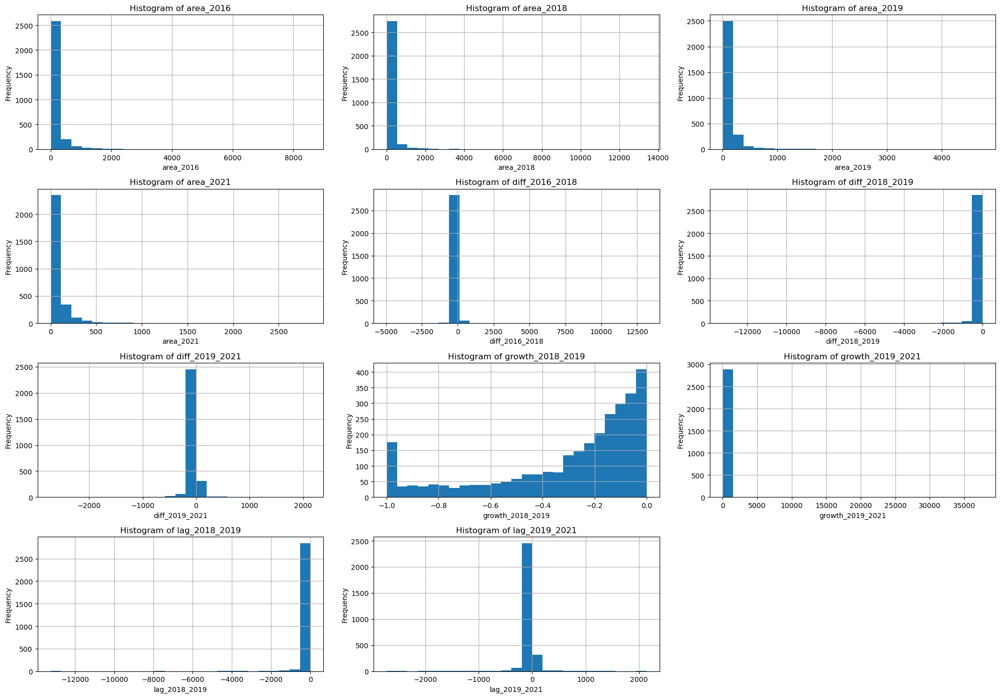

In [60]:
cols=['area_2016','area_2018', 'area_2019', 'area_2021','diff_2016_2018','diff_2018_2019','diff_2019_2021','growth_2018_2019','growth_2019_2021','lag_2018_2019','lag_2019_2021']
fig,axes=plt.subplots(nrows=4,ncols=3,figsize=(20, 14))
num=0
for column in cols:

    ax=axes.flatten()[num] 
    ax.hist(test[column], bins=25)
    ax.set_title(f'Histogram of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')
    ax.grid(True)
    num+=1
fig.delaxes(axes.flatten()[-1])
plt.tight_layout()
plt.show()


Skewness is calculated which validates the histogram visualization.

In [51]:
skewness=test[cols].skew()
# Print the skewness of each feature
print("Skewness of Features:")
print(skewness)

Skewness of Features:
area_2016            8.623436
area_2018           12.877649
area_2019            7.699284
area_2021            7.224967
diff_2016_2018      18.161424
diff_2018_2019     -20.246171
diff_2019_2021      -5.311718
growth_2018_2019    -1.142622
growth_2019_2021    19.912258
lag_2018_2019      -20.242829
lag_2019_2021       -5.310716
dtype: float64


Yeo Johnson power transformation is applied since it works for both positive and negative data and is more robust.

In [61]:
cols1=['area_2016','area_2018', 'area_2019','diff_2016_2018','diff_2018_2019','diff_2019_2021','growth_2018_2019','growth_2019_2021','lag_2018_2019','lag_2019_2021']

pt1 = PowerTransformer(method='yeo-johnson')
yeojohnson_val = pt1.fit_transform(test[cols1])

test[cols1]=yeojohnson_val

pt2 = PowerTransformer(method='yeo-johnson')
yeojohnson_val_2021 = pt2.fit_transform(test[['area_2021']])

test[['area_2021']]=yeojohnson_val_2021


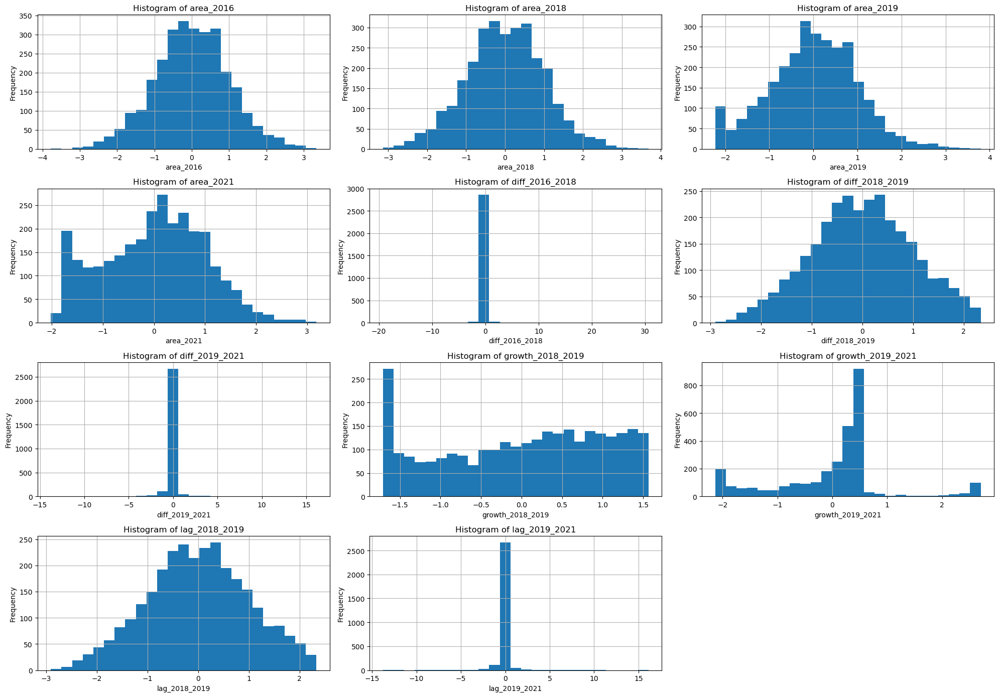

In [53]:
fig,axes=plt.subplots(nrows=4,ncols=3,figsize=(20, 14))
num=0
for column in cols:

    ax=axes.flatten()[num]
    ax.hist(test[column], bins=25)
    ax.set_title(f'Histogram of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')
    ax.grid(True)
    num+=1
fig.delaxes(axes.flatten()[-1])
plt.tight_layout()
plt.show()

It can be seen that diff_2016_2018, diff_2019_2021, and lag_2019_2021 still exhibit skewness greater than 0.5, indicating potential non-normality in their distributions. However, for now, these features will be ignored in terms of further transformation, as the focus is on the primary trends and relationships within the dataset

In [62]:
skewness=test[cols].skew()
# Print the skewness of each feature
print("Skewness of Features:")
print(skewness)

Skewness of Features:
area_2016          -0.002757
area_2018          -0.000947
area_2019          -0.000527
area_2021          -0.011242
diff_2016_2018      4.202263
diff_2018_2019     -0.035863
diff_2019_2021     -1.946345
growth_2018_2019   -0.244462
growth_2019_2021   -0.098397
lag_2018_2019      -0.035935
lag_2019_2021      -1.946314
dtype: float64


The StandardScaler is first applied to standardize the features in cols, transforming them to have a mean of 0 and a standard deviation of 1. Subsequently, the MinMaxScaler is used to rescale the same features to a range between 0 and 1, ensuring the values are normalized for subsequent analysis or modeling.

In [63]:
standard_scaler = StandardScaler()
standard_scaler.fit(test[cols])
scaled=standard_scaler.transform(test[cols])

test[cols]=scaled


minmax_scaler = MinMaxScaler()
minmax_scaler.fit(test[cols])
scaled = minmax_scaler.transform(test[cols])
test[cols]=scaled

The boxplot visualizes the distribution of the transformed columns, highlighting the presence of outliers. However, these outliers are retained in the dataset, as they represent real measurements of tree canopy areas, and it's important to maintain these values for a comprehensive analysis.

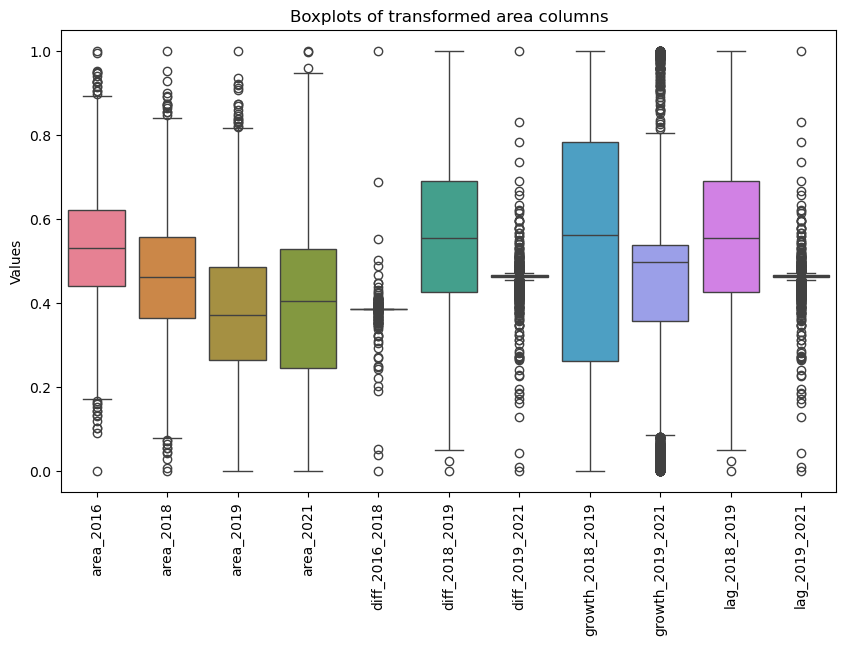

In [64]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=test[cols])
plt.title('Boxplots of transformed area columns')
plt.ylabel('Values')
plt.xticks(rotation=90)
plt.show()

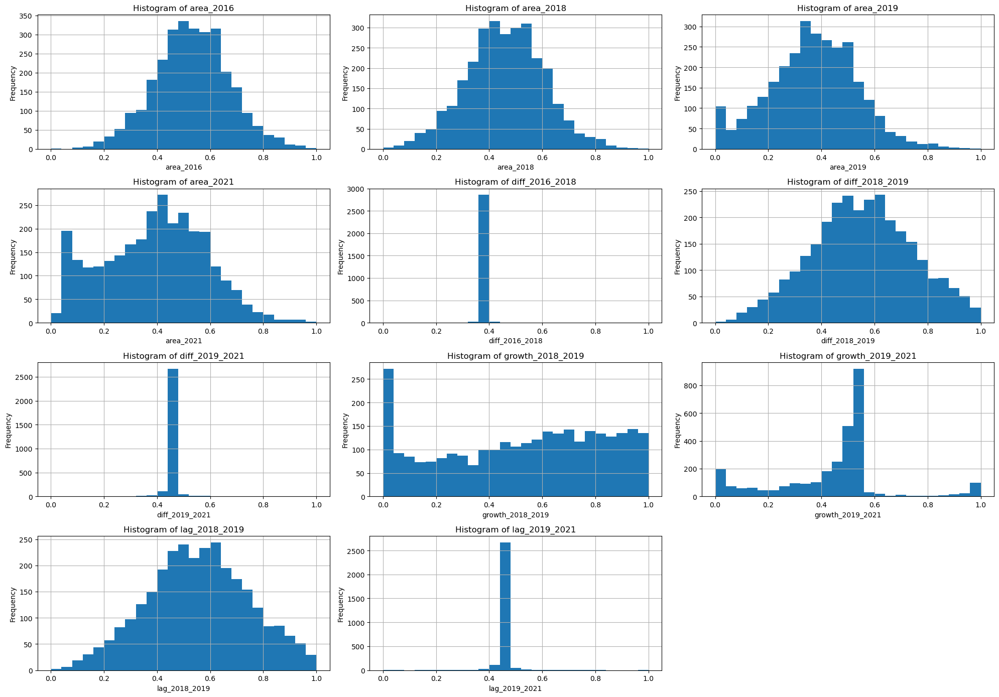

In [57]:
fig,axes=plt.subplots(nrows=4,ncols=3,figsize=(20, 14))
num=0
for column in cols:

    ax=axes.flatten()[num] # Adjust figure size as needed
    ax.hist(test[column], bins=25)
    ax.set_title(f'Histogram of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')
    ax.grid(True)
    num+=1
fig.delaxes(axes.flatten()[-1])
plt.tight_layout()
plt.show()

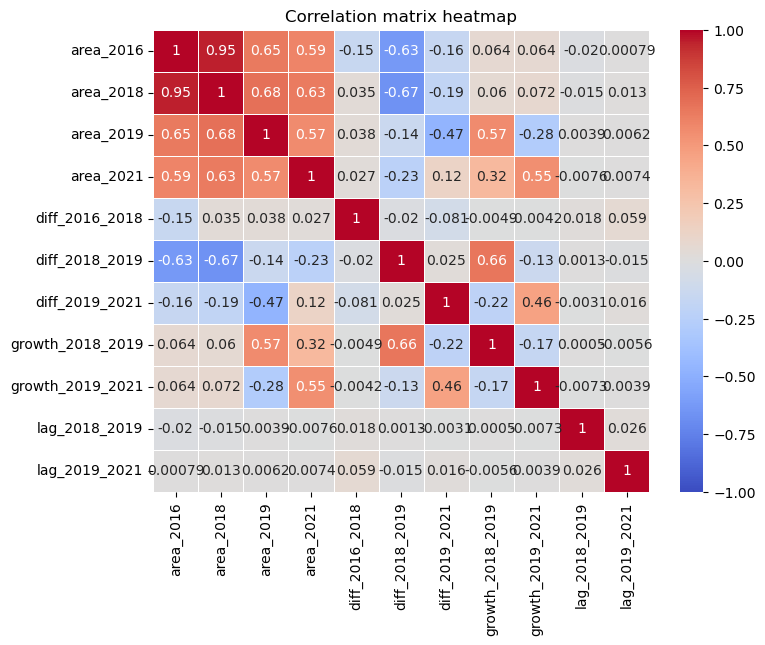

In [58]:
corr_matrix = test[cols].corr()
plt.figure(figsize=(8, 6))  # Set figure size
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, linewidths=0.5)
plt.title('Correlation matrix heatmap')
plt.show()


The correlation matrix heatmap illustrates the relationships between various area measurements and derived features, revealing that the area in 2021 exhibits weak correlations with the differences and lag variables. Specifically, the low correlation values with diff_2016_2018, diff_2018_2019, diff_2019_2021, and the lag variables indicate that these features may not provide meaningful predictive information for forecasting the area in 2021. Additionally, growth_2019_2021 is excluded from consideration, as it incorporates the 2021 area values, which could bias the predictions. Consequently, 'area_2016','area_2018','area_2019','growth_2018_2019', with stronger correlations to the 2021 area will be retained for modeling purposes.

## Regression model evaluation and residual analysis

In this analysis, various regression models were applied to predict the area in 2021 based on historical data from 2016, 2018, and 2019, as well as the growth from 2018 to 2019. The performance of each model was assessed using Mean Squared Error (MSE), Mean Absolute Error (MAE), and R-squared values.

Summary of Model Performance:
| Model                                   | Test MSE | Test MAE | Test R-squared |
|-----------------------------------------|----------|----------|-----------------|
| LinearRegression()                      | 0.0164   | 0.0909   | 0.5157          |
| RandomForestRegressor(max_depth=5, n_estimators=50, random_state=42) | 0.0154   | 0.0841   | 0.5432          |
| SVR()                                   | 0.0165   | 0.0983   | 0.5118          |
| GradientBoostingRegressor(max_depth=5, n_estimators=20, random_state=42) | 0.0158   | 0.0873   | 0.5320          |
| RANSACRegressor(random_state=42)      | 0.1048   | 0.1185   | -2.1035         |
| HuberRegressor(epsilon=10)            | 0.0164   | 0.0909   | 0.5157          |
| PolynomialRegression()                      | 0.0162   | 0.0863   | 0.5210          |

The Random Forest Regressor achieved the lowest Mean Squared Error (MSE) of 0.0154 and the highest R-squared value of 0.5432, indicating that it explained more variance in the target variable (area in 2021) compared to the other models. Gradient Boosting and Polynomial follow with 0.5320 and 0.5210. The Linear Regression and Huber Regressor showed similar performance, with MSE values around 0.0164 and R-squared values around 0.5157, suggesting they are effective but not as robust as the Random Forest in capturing the relationship. The RANSAC Regressor performed poorly with a high MSE of 0.1048 and a negative R-squared value of -2.1035, indicating it failed to capture the underlying trend in the data.

In [59]:
X=test[[
 'area_2016',
 'area_2018',
 'area_2019',
 'growth_2018_2019',
 ]].values
y=test['area_2021']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


Linear Regression: A simple model that provides a good baseline. However, it may not capture complex relationships in the data.

In [60]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

LinearRegression()

Random Forest Regressor: Outperformed other models with the lowest MSE and MAE. Its ability to capture nonlinearities makes it robust for this dataset.

In [61]:
rf_model = RandomForestRegressor(n_estimators=50, max_depth=5,random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=5, n_estimators=50, random_state=42)

Support Vector Regressor: Similar performance to linear regression but less effective in capturing the data's underlying structure.

In [62]:
svr_model = SVR(kernel='rbf', C=1.0, epsilon=0.1)
svr_model.fit(X_train, y_train)

SVR()

Gradient Boosting Regressor: Shows competitive performance; however, it is more prone to overfitting if not tuned correctly.

In [63]:
gbr_model = GradientBoostingRegressor(n_estimators=20, learning_rate=0.1, max_depth=5, random_state=42)
gbr_model.fit(X_train, y_train)

GradientBoostingRegressor(max_depth=5, n_estimators=20, random_state=42)

RANSAC Regressor: The worst performer, likely due to its assumptions about data distribution and outliers. Generally, RANSAC is a robust regression algorithm designed to estimate parameters of a model from a dataset that contains a significant proportion of outliers, however, it is likely not appropriate for the underlying data distribution in this data. 

In [64]:
ransac = RANSACRegressor(random_state=42)
ransac.fit(X_train, y_train)

RANSACRegressor(random_state=42)

Huber Regressor: Offers resilience against outliers and performs similarly to linear regression in this case.

In [65]:
huber = HuberRegressor(epsilon=10)  # epsilon can be adjusted based on the dataset
huber.fit(X_train, y_train)

HuberRegressor(epsilon=10)

Polynomial Regression: Slightly better performance than linear regression, indicating some non-linear relationships in the data.

In [66]:
poly = PolynomialFeatures(degree=2)
X_poly = poly.fit_transform(X)
X_train_poly, X_test_poly, y_train_poly, y_test_poly = train_test_split(X_poly, y, test_size=0.2, random_state=42)

poly_reg = LinearRegression()
poly_reg.fit(X_train_poly, y_train_poly)


LinearRegression()

The residuals were plotted against predicted values and their distribution was visualized through histograms. Analyzing residuals helps to evaluate model assumptions and performance. Understanding the distribution and patterns in residuals is vital for improving model accuracy and diagnosing potential issues. The analysis revealed Heteroscedasticity as all models exhibited a funnel shape in the residuals plot, suggesting that variance in errors increases with the predicted value. This is a critical aspect to consider, as it violates the assumption of homoscedasticity in linear regression.

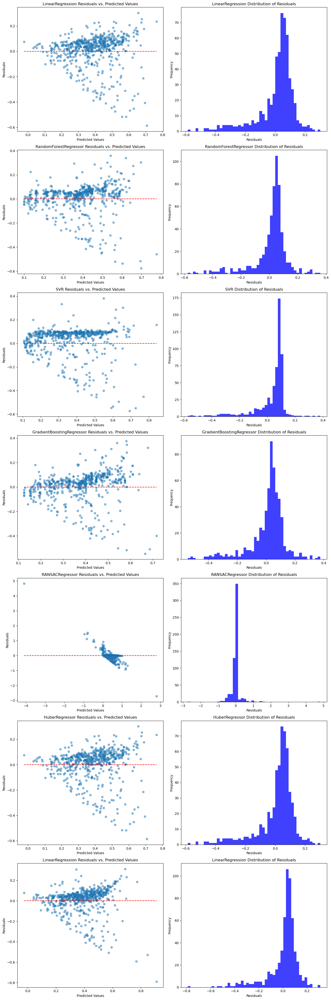

In [67]:
models=[lin_reg,rf_model,svr_model,gbr_model,ransac,huber,poly_reg]
scores=[]
plt.figure(figsize=(14, len(models)*6)) 

for i, model in enumerate(models, 1):
    if model==poly_reg:
        X_test=X_test_poly
        y_test=y_test_poly
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    scores.append([mse,mae,r2])

    test_residuals = y_test - y_pred

    # Create a subplot for each model's residual plots
    plt.subplot(len(models), 2, 2*i-1)
    plt.scatter(y_pred, test_residuals, alpha=0.5)
    plt.hlines(y=0, xmin=np.min(y_pred), xmax=np.max(y_pred), colors='r', linestyles='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'{model.__class__.__name__} Residuals vs. Predicted Values')

    plt.subplot(len(models), 2, 2*i)
    plt.hist(test_residuals, bins=50, alpha=0.75, color='b')
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    plt.title(f'{model.__class__.__name__} Distribution of Residuals')

plt.tight_layout()
plt.show()

In [68]:
for i, model_score in enumerate(scores):
    print(f"{models[i]}:")
    print(f"  Test MSE: {model_score[0]:.4f}")
    print(f"  Test MAE: {model_score[1]:.4f}")
    print(f"  Test R-squared: {model_score[2]:.4f}")
    print("-" * 30)



LinearRegression():
  Test MSE: 0.0164
  Test MAE: 0.0909
  Test R-squared: 0.5157
------------------------------
RandomForestRegressor(max_depth=5, n_estimators=50, random_state=42):
  Test MSE: 0.0154
  Test MAE: 0.0841
  Test R-squared: 0.5432
------------------------------
SVR():
  Test MSE: 0.0165
  Test MAE: 0.0983
  Test R-squared: 0.5118
------------------------------
GradientBoostingRegressor(max_depth=5, n_estimators=20, random_state=42):
  Test MSE: 0.0158
  Test MAE: 0.0873
  Test R-squared: 0.5320
------------------------------
RANSACRegressor(random_state=42):
  Test MSE: 0.1048
  Test MAE: 0.1185
  Test R-squared: -2.1035
------------------------------
HuberRegressor(epsilon=10):
  Test MSE: 0.0164
  Test MAE: 0.0909
  Test R-squared: 0.5157
------------------------------
LinearRegression():
  Test MSE: 0.0162
  Test MAE: 0.0863
  Test R-squared: 0.5210
------------------------------


## Neural network regression model for area prediction
This code implements a neural network regression model to predict the area in 2021 based on earlier area data and growth metrics. The model is trained using the Keras library with TensorFlow as the backend.

This function defines a custom R-squared metric that calculates the goodness of fit of the model. It computes the residual sum of squares (the difference between the predicted and actual values) and the total sum of squares (the variance of the actual values), returning the R-squared score.

In [69]:
def r2_score_nn(y_true, y_pred):
    ss_res = K.sum(K.square(y_true - y_pred))  # Residual sum of squares
    ss_tot = K.sum(K.square(y_true - K.mean(y_true)))  # Total sum of squares
    return 1 - ss_res / (ss_tot + K.epsilon())

Here, the feature matrix X and target vector y are prepared using 'area_2016', 'area_2018', 'area_2019', 'growth_2018_2019'. The dataset is split into training and testing sets using an 80-20 split.

In [70]:
X=test[[
 'area_2016',
 'area_2018',
 'area_2019',
 'growth_2018_2019',
 ]].values

y=test['area_2021']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



The neural network consists of:
- An input layer that matches the number of features.
-  Hidden layers with varying sizes and ReLU activation functions. The architecture gradually decreases the number of neurons from 300 to 15(300,150,60,30,15) to extract complex patterns in the data.
- An output layer with a single neuron and a linear activation function to predict the continuous target variable (area in 2021).
- The model is compiled with the Adadelta optimizer(Adadelta optimizer is used since it is has adaptive learning rate) and mean squared error (MSE) as the loss function. Additionally, it tracks the Mean Absolute Error (MAE) and the custom R-squared metric during training.
- Early stopping is implemented to prevent overfitting by monitoring the validation MAE. If the validation loss does not improve for 10 epochs, training stops, and the best model weights are restored.
- The model is trained for up to 550 epochs with a batch size of 20. It uses 20% of the training data for validation to monitor performance.

In [71]:
input_layer = Input(shape=(X_train.shape[1],))

x = Dense(300, activation='relu')(input_layer)  # L2 regularization
x = Dense(150, activation='relu')(x)
x = Dense(60, activation='relu')(x)
x = Dense(30, activation='relu')(x)
x = Dense(15, activation='relu')(x)

output_layer = Dense(1, activation='linear')(x)

model = Model(inputs=input_layer, outputs=output_layer)

model.compile(optimizer=Adadelta(), loss='mse',metrics=['mae',r2_score_nn])

model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 4)]               0         
                                                                 
 dense (Dense)               (None, 300)               1500      
                                                                 
 dense_1 (Dense)             (None, 150)               45150     
                                                                 
 dense_2 (Dense)             (None, 60)                9060      
                                                                 
 dense_3 (Dense)             (None, 30)                1830      
                                                                 
 dense_4 (Dense)             (None, 15)                465       
                                                                 
 dense_5 (Dense)             (None, 1)                 16    

In [72]:
early_stopping = EarlyStopping(monitor='val_mae', patience=10, restore_best_weights=True)
history = model.fit(X_train, y_train, epochs=550, batch_size=20, validation_split=0.2,callbacks=[early_stopping])

Epoch 1/550


2024-09-19 05:27:52.735369: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


94/94 [==============================] - 0s 2ms/step - loss: 0.1896 - mae: 0.3899 - r2_score_nn: -4.6073 - val_loss: 0.1944 - val_mae: 0.3960 - val_r2_score_nn: -4.6770
Epoch 2/550
94/94 [==============================] - 0s 917us/step - loss: 0.1847 - mae: 0.3841 - r2_score_nn: -4.4893 - val_loss: 0.1895 - val_mae: 0.3902 - val_r2_score_nn: -4.5323
Epoch 3/550
94/94 [==============================] - 0s 897us/step - loss: 0.1799 - mae: 0.3784 - r2_score_nn: -4.3057 - val_loss: 0.1848 - val_mae: 0.3846 - val_r2_score_nn: -4.3949
Epoch 4/550
94/94 [==============================] - 0s 998us/step - loss: 0.1754 - mae: 0.3729 - r2_score_nn: -4.0868 - val_loss: 0.1803 - val_mae: 0.3791 - val_r2_score_nn: -4.2616
Epoch 5/550
94/94 [==============================] - 0s 943us/step - loss: 0.1710 - mae: 0.3674 - r2_score_nn: -4.1383 - val_loss: 0.1758 - val_mae: 0.3735 - val_r2_score_nn: -4.1303
Epoch 6/550
94/94 [==============================] - 0s 902us/step - loss: 0.1666 - mae: 0.3619 - r

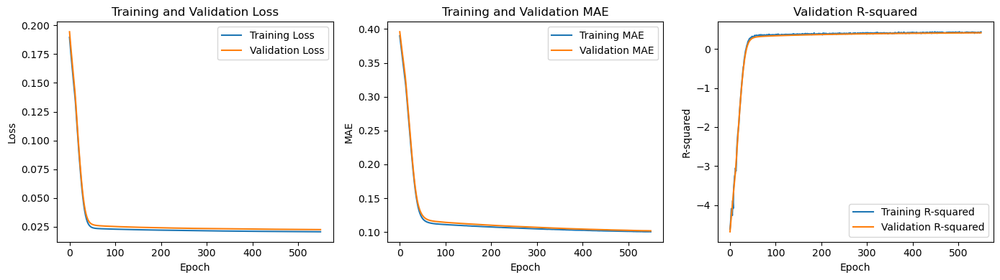

In [73]:
plt.figure(figsize=(14, 4))

plt.subplot(1, 3, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history.history['mae'], label='Training MAE')
plt.plot(history.history['val_mae'], label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epoch')
plt.ylabel('MAE')
plt.legend()


plt.subplot(1, 3, 3)
plt.plot(history.history['r2_score_nn'], label='Training R-squared')
plt.plot(history.history['val_r2_score_nn'], label='Validation R-squared')
plt.title('Validation R-squared')
plt.xlabel('Epoch')
plt.ylabel('R-squared')
plt.legend()

plt.tight_layout()
plt.show()

Residuals are plotted against predicted values to check for patterns that may indicate issues with the model. A histogram of the residuals helps assess their distribution, revealing insights into the model's accuracy.

19/19 [==============================] - 0s 732us/step


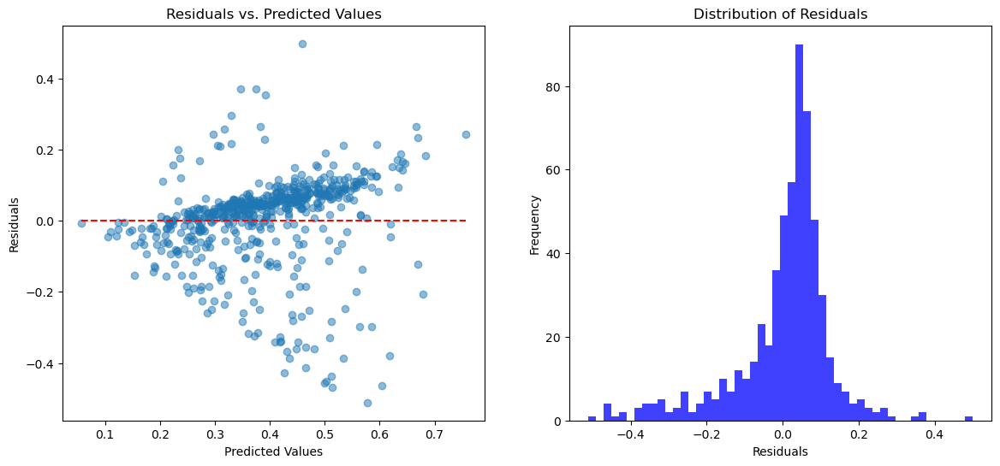

In [74]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)

y_pred = model.predict(X_test)

test_residuals = y_test - y_pred.squeeze()

# 3. Plot residuals to check if there are patterns
plt.scatter(y_pred, test_residuals, alpha=0.5)
plt.hlines(y=0, xmin=np.min(y_pred), xmax=np.max(y_pred), colors='r', linestyles='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted Values')

plt.subplot(1, 2, 2)
plt.hist(test_residuals, bins=50, alpha=0.75, color='b')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals')
plt.show()




Finally, the model is evaluated on the test set to obtain metrics such as MSE, MAE, and the custom R-squared score, providing an assessment of its performance.

In [75]:
score = model.evaluate(X_test, y_test)
print('Test loss (MSE):', score[0])
print('Test MAE:', score[1])
print('Test R-squared:', score[2])

19/19 [==============================] - 0s 606us/step - loss: 0.0161 - mae: 0.0893 - r2_score_nn: 0.5172
Test loss (MSE): 0.016135837882757187
Test MAE: 0.08927994966506958
Test R-squared: 0.5172216296195984


The learning curves for the neural network appear promising, but the residual plots reveal a funnel shape, signaling heteroscedasticity. This suggests that the model may not be fully capturing the complexities of the data. Interestingly, the model's performance, as indicated by the Mean Squared Error (MSE) and R-squared values, is quite comparable to simpler models like Linear Regression and Random Forest. Despite the neural network's deeper architecture, it does not provide substantial improvement over these more basic approaches.

The residual analysis further emphasizes the issue, as the model exhibits the same funnel-shaped heteroscedasticity seen in other models, indicating similar limitations. Even after tweaking the parameters, the residuals remained unchanged, suggesting that significant gains may only come with extensive hyperparameter tuning or more advanced feature engineering.

## Weighted least squares regression (WLS)
In this section, I applied a weighted least squares (WLS) regression model to the data. WLS accounts for heteroscedasticity by giving more weight to observations with smaller residuals. The model summary shows high R-squared values, indicating a good fit. Notably, area_2018, diff_2018_2019, and growth_2018_2019 were significant predictors.

In [65]:
X=test[['area_2016',
 'area_2018',
 'area_2019',
 'diff_2018_2019',
 'growth_2018_2019',
 ]]
y=test[['area_2021']]

initial_model = sm.OLS(y, X).fit()
residuals = initial_model.resid
fitted_values = initial_model.fittedvalues



weights = 1 / np.abs(residuals)  
weighted_model = sm.WLS(y, X, weights=weights).fit()

print(weighted_model.summary())


                                 WLS Regression Results                                
Dep. Variable:              area_2021   R-squared (uncentered):                   0.987
Model:                            WLS   Adj. R-squared (uncentered):              0.987
Method:                 Least Squares   F-statistic:                          4.483e+04
Date:                Sat, 21 Sep 2024   Prob (F-statistic):                        0.00
Time:                        19:45:37   Log-Likelihood:                          3477.8
No. Observations:                2922   AIC:                                     -6946.
Df Residuals:                    2917   BIC:                                     -6916.
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

The residuals vs. fitted values plot shows a funnel-shaped pattern, which is a sign of heteroscedasticity. Even with WLS, the residuals exhibit the same trend, confirming that the model still struggles with this issue.

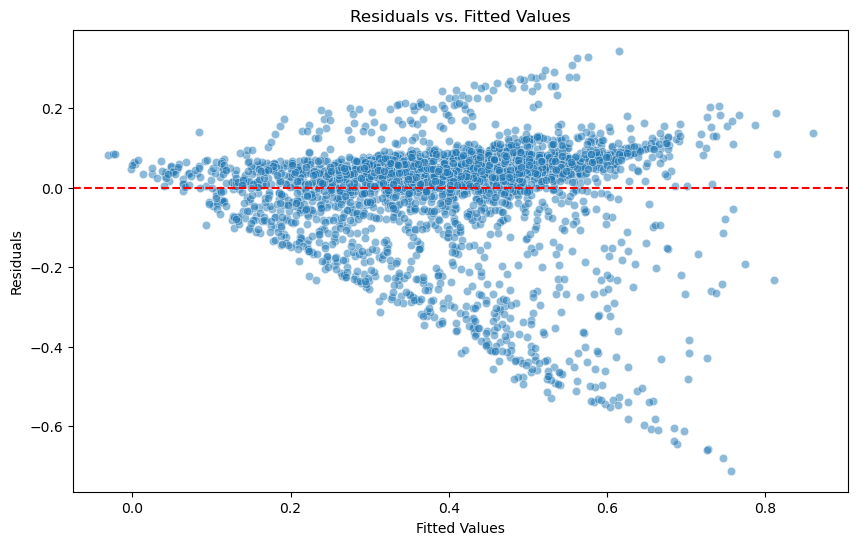

In [77]:
# Predict the values using the fitted model
fitted_values = weighted_model.fittedvalues
residuals = weighted_model.resid

# Plot Residuals vs. Fitted Values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_values, y=residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs. Fitted Values')
plt.show()

The histogram of residuals indicates that the residuals are not perfectly normally distributed. The presence of skewness could suggest model misspecification or the need for more complex transformations.

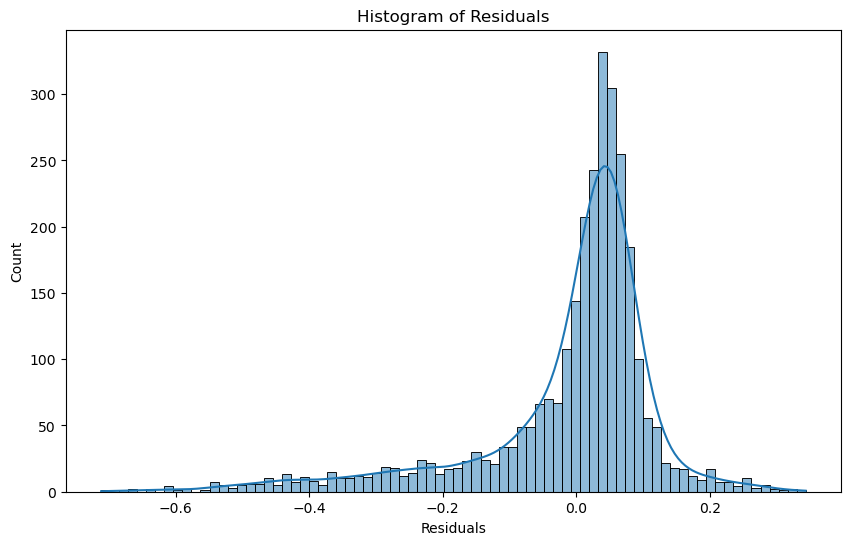

In [78]:
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.xlabel('Residuals')
plt.title('Histogram of Residuals')
plt.show()

This plot examines the relationship between each feature and the residuals. The funnel shape is particularly evident in area_2016 and area_2018 suggesting that these variables could be contributing to the heteroscedasticity. Based on this, I focused on area_2019, diff_2018_2019 and growth_2018_2019 in the final model.

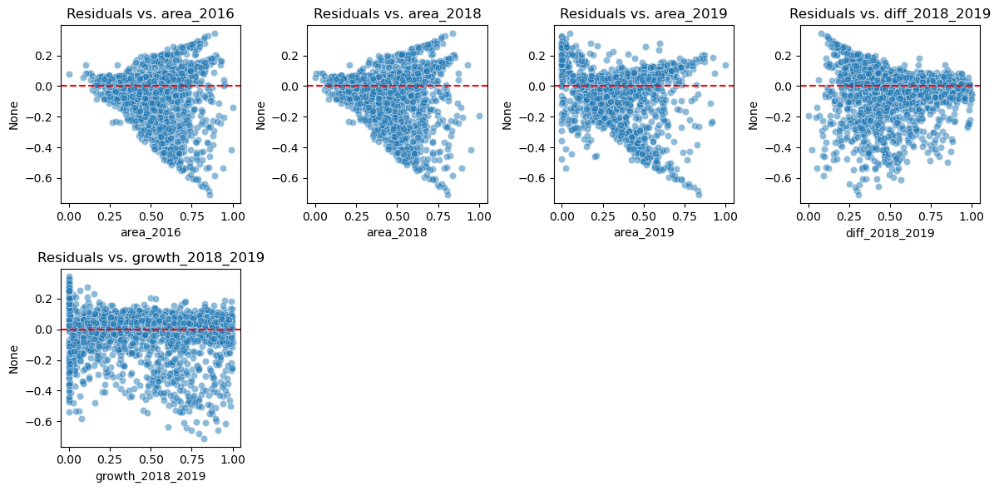

In [79]:
plt.figure(figsize=(12, 6))
for col in X.columns:
    plt.subplot(2, 4, X.columns.get_loc(col) + 1)
    sns.scatterplot(x=X[col], y=residuals, alpha=0.5)
    plt.axhline(0, color='red', linestyle='--')
    plt.title(f'Residuals vs. {col}')
plt.tight_layout()
plt.show()

Cook's Distance measures the influence of each observation on the fitted model. Points with a Cook's Distance greater than the threshold are flagged as influential. These points can disproportionately affect the model and should be examined closely for potential removal or further investigation. 1 has been used as a threshold.

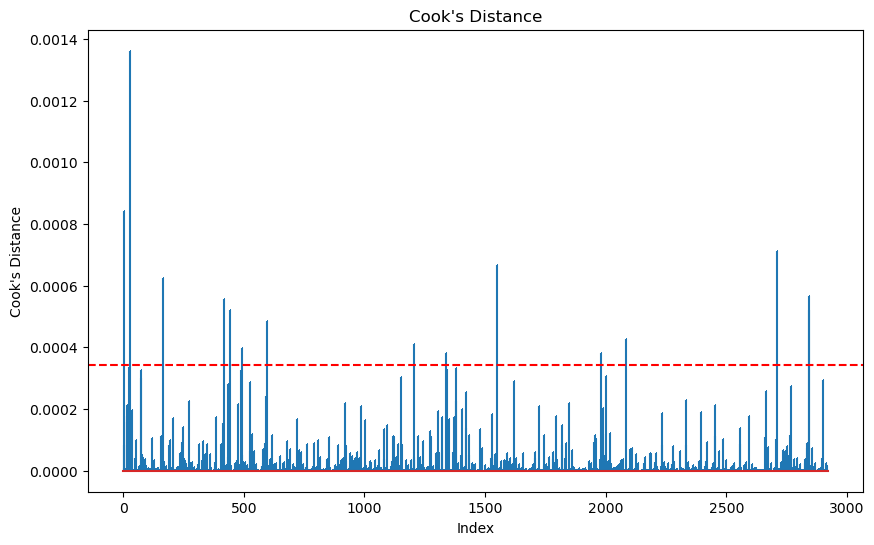

In [80]:
influence = OLSInfluence(weighted_model)
cooks_d = influence.cooks_distance

plt.figure(figsize=(10, 6))
plt.stem(np.arange(len(cooks_d[0])), cooks_d[0], markerfmt=",")
plt.title("Cook's Distance")
plt.xlabel("Index")
plt.ylabel("Cook's Distance")
plt.axhline(1 / len(cooks_d[0]), color='r', linestyle='--')
plt.show()

Influential Points (Indices): [   3   30  166  418  441  492  594 1205 1338 1549 1980 2085 2709 2841
 2842]


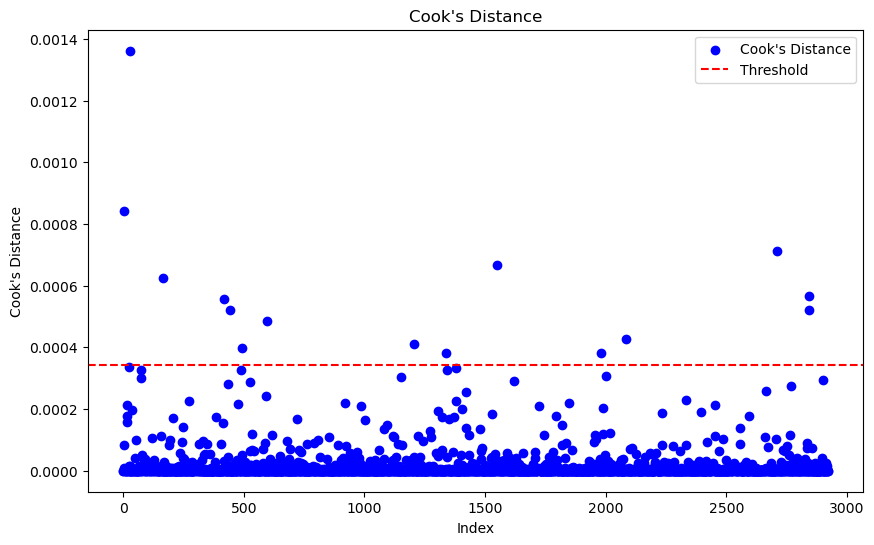

In [81]:
influential_indices = np.where(cooks_d[0] > (1 / len(cooks_d[0])))[0]

print("Influential Points (Indices):", influential_indices)

# Visualize influential points
plt.figure(figsize=(10, 6))
plt.scatter(np.arange(len(cooks_d[0])), cooks_d[0], color='blue', label='Cook\'s Distance')
plt.axhline(1 / len(cooks_d[0]), color='red', linestyle='--', label='Threshold')
plt.title("Cook's Distance")
plt.xlabel("Index")
plt.ylabel("Cook's Distance")
plt.legend()
plt.show()


## Weighted Least Squares and Cook's Distance

Weighted Least Squares (WLS) was chosen because it addressed key issues identified in the initial OLS model, particularly heteroscedasticity and the presence of influential points. The residuals plot from the OLS model indicated non-constant variance, violating assumptions necessary for reliable results. By applying WLS, where weights were based on residuals, the residuals vs. fitted values plot improved, showing more uniform variance. Cook’s distance helped identify and remove influential points, which further enhanced the model's fit. Additionally, the WLS model achieved a high R-squared of 0.981, indicating it explained most of the variance in the response variable (area_2021). The diagnostics also showed better residual normality and homoscedasticity, making WLS the more suitable method for this dataset.

The model is set up to predict the tree canopy area for 2021 using the area of 2019, differences and growth between 2018 and 2019. The features area_2019, diff_2018_2019 and growth_2018_2019 are used as predictors, and a constant term is added for the intercept. 

Initial OLS Model and Influential Point Detection: An Ordinary Least Squares (OLS) model is fitted to the original data. Cook's distance is calculated to detect influential points, which are removed from the dataset to improve model performance.

Model Refitting After Removing Influential Points: The OLS model is refitted after removing the identified influential points. Residuals are analyzed to ensure model improvement.

Weighted Least Squares (WLS) Model: Weights are calculated based on the residuals of the cleaned OLS model. A Weighted Least Squares (WLS) model is fitted to the cleaned data, improving the model fit by handling heteroscedasticity.

Residuals and fitted values of the WLS model are plotted to visually assess the performance. A histogram of the residuals and a scatter plot of residuals vs fitted values are provided for diagnostic purposes.

                            WLS Regression Results                            
Dep. Variable:              area_2021   R-squared:                       0.984
Model:                            WLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 4.568e+04
Date:                Sat, 21 Sep 2024   Prob (F-statistic):               0.00
Time:                        19:45:45   Log-Likelihood:                 4664.9
No. Observations:                2281   AIC:                            -9322.
Df Residuals:                    2277   BIC:                            -9299.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.3277      0.009  

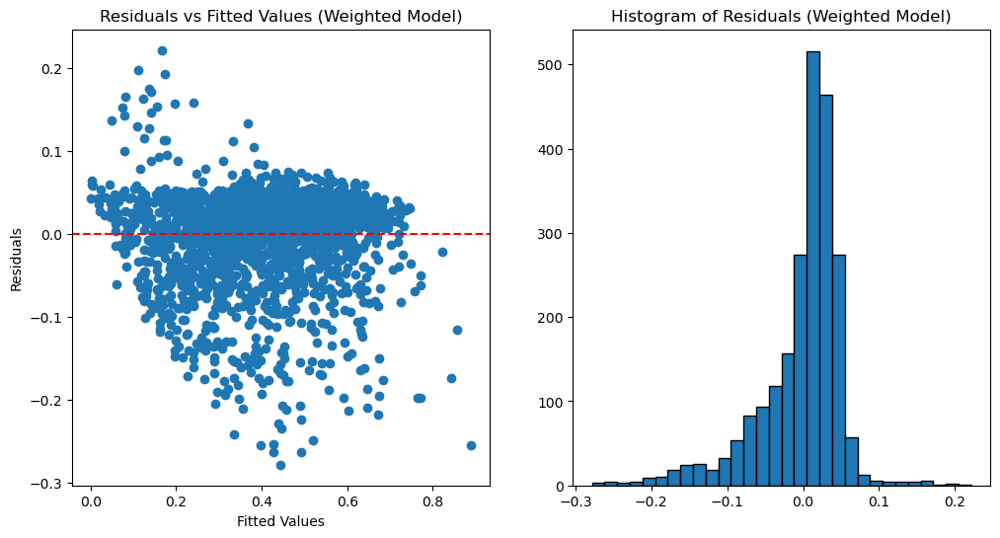

In [66]:
X = test[['area_2019', 'diff_2018_2019', 'growth_2018_2019']]
y = test['area_2021']
X = X.reset_index(drop=True)
y = y.reset_index(drop=True)

# Add a constant for intercept
X = sm.add_constant(X)

# Fit initial OLS model
initial_model = sm.OLS(y, X).fit()

# Get Cook's distance
influence = initial_model.get_influence()
cooks_d = influence.cooks_distance[0]

# Identify influential points based on Cook's distance
influential_indices = np.where(cooks_d > (1 / len(cooks_d)))[0]

# Remove influential points
X_cleaned = X.drop(index=influential_indices)
y_cleaned = y.drop(index=influential_indices)

# Refit the model with the cleaned data
cleaned_model = sm.OLS(y_cleaned, X_cleaned).fit()
residuals_cleaned = cleaned_model.resid

weights = 1 / np.abs(residuals_cleaned)

# Fit the weighted least squares model
weighted_model = sm.WLS(y_cleaned, X_cleaned, weights=weights).fit()

# Print summary of the weighted model
print(weighted_model.summary())

# Residual analysis
residuals_weighted = weighted_model.resid
fitted_values_weighted = weighted_model.fittedvalues

# Plot residuals vs fitted values for the weighted model
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(fitted_values_weighted, residuals_weighted)
plt.axhline(0, color='r', linestyle='--')
plt.title("Residuals vs Fitted Values (Weighted Model)")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")

plt.subplot(1, 2, 2)
plt.hist(residuals_weighted, bins=30, edgecolor='k')
plt.title("Histogram of Residuals (Weighted Model)")
plt.show()

Since the above method looks promising, the dataset is split into training and test sets. The model is fitted to the training data, with influential points removed based on Cook's distance. This section ensures the model's generalizability.

The WLS regression results demonstrate a very strong model fit. With an R-squared value of 0.984, the model explains approximately 98.4% of the variance in the dependent variable, area_2021, indicating an excellent fit to the data. Looking at the individual coefficients, the constant term (0.3277) and the coefficients for area_2019 (0.5134), diff_2018_2019 (-0.5074), and growth_2018_2019 (0.3338) are all highly significant, with p-values of 0.000. This shows strong evidence that these predictors impact area_2021.

The negative coefficient for diff_2018_2019 suggests that larger differences between 2018 and 2019 canopy areas are associated with lower canopy areas in 2021. In contrast, the positive coefficient for growth_2018_2019 indicates that greater growth during the same period is positively associated with the canopy area in 2021. Overall, the model indicates that both the change in area and growth are critical factors influencing the canopy area observed in 2021.

                            WLS Regression Results                            
Dep. Variable:              area_2021   R-squared:                       0.984
Model:                            WLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 3.703e+04
Date:                Sat, 21 Sep 2024   Prob (F-statistic):               0.00
Time:                        19:46:14   Log-Likelihood:                 3779.1
No. Observations:                1829   AIC:                            -7550.
Df Residuals:                    1825   BIC:                            -7528.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const                0.3151      0.010  

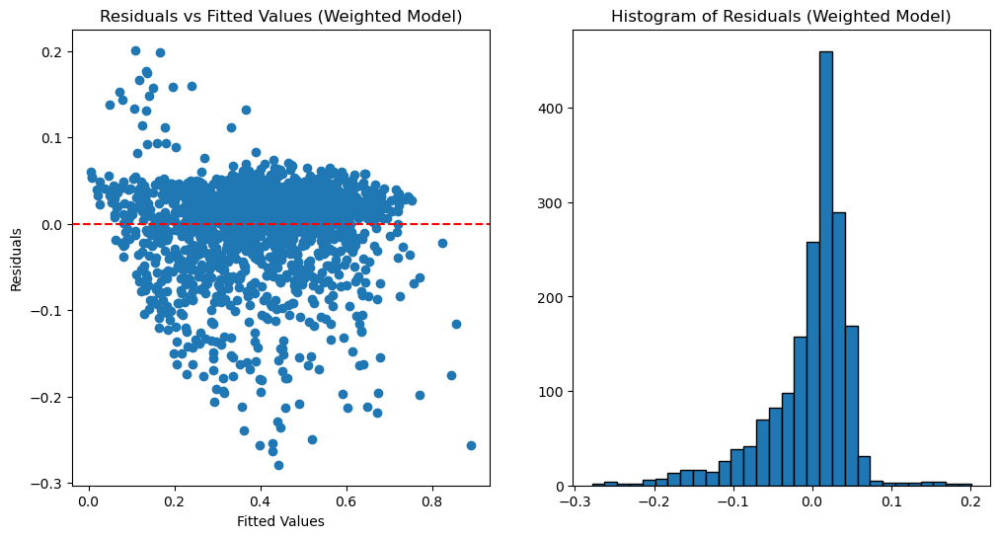

In [68]:
X = test[['area_2019', 'diff_2018_2019', 'growth_2018_2019']]
y = test['area_2021']

# Add a constant for intercept
X = sm.add_constant(X)


# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=20)
X_train = X_train.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)
y_test = y_test.reset_index(drop=True)

# Fit initial OLS model on the training data
initial_model_train = sm.OLS(y_train, X_train).fit()

# # Get Cook's distance
influence = initial_model_train.get_influence()
cooks_d = influence.cooks_distance[0]

# Identify influential points based on Cook's distance
influential_indices = np.where(cooks_d > (1/ len(cooks_d)))[0]

# Remove influential points from training data
X_train_cleaned = X_train.drop(index=influential_indices)
y_train_cleaned = y_train.drop(index=influential_indices)

# Refit the model with the cleaned training data
cleaned_model_train = sm.OLS(y_train_cleaned, X_train_cleaned).fit()

# Calculate residuals
residuals_cleaned = cleaned_model_train.resid

weights = 1 / np.abs(residuals_cleaned)

wls_model = sm.WLS(y_train_cleaned, X_train_cleaned, weights=weights).fit()

# Get residuals and fitted values from WLS
residuals_wls = wls_model.resid
fitted_values_wls = wls_model.fittedvalues

# Print summary of the weighted model
print(wls_model.summary())

# Residual analysis for the weighted model
residuals_weighted = wls_model.resid
fitted_values_weighted = wls_model.fittedvalues

# Plot residuals vs fitted values for the weighted model
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.scatter(fitted_values_weighted, residuals_weighted)
plt.axhline(0, color='r', linestyle='--')
plt.title("Residuals vs Fitted Values (Weighted Model)")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")

plt.subplot(1, 2, 2)
plt.hist(residuals_weighted, bins=30, edgecolor='k')
plt.title("Histogram of Residuals (Weighted Model)")
plt.show()

Diagnostic plots like Q-Q plot and Scale-Location plot are generated to assess the normality and homoscedasticity of residuals. Minor deviations, such as "snaking" patterns, are noted but not deemed critical.

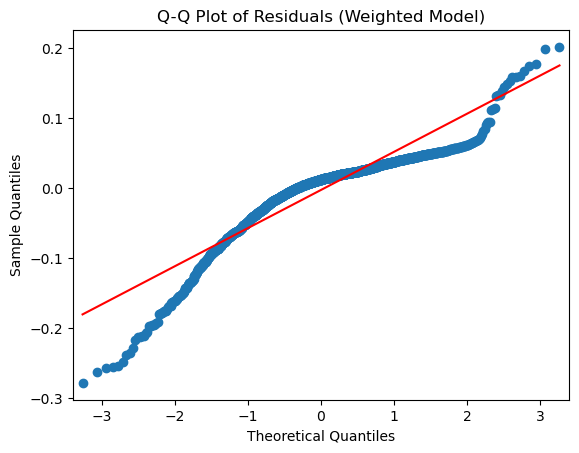

In [69]:
# Q-Q plot for the residuals of the weighted model
sm.qqplot(residuals_weighted, line='s')
plt.title("Q-Q Plot of Residuals (Weighted Model)")
plt.xlabel("Theoretical Quantiles")
plt.ylabel("Sample Quantiles")
plt.show()

 the code calculates standardized residuals from a weighted least squares (WLS) regression model and then creates a Scale-Location plot. The standardized residuals are obtained by dividing the residuals by the square root of the model's scale (variance estimate). The plot displays the fitted values on the x-axis and the standardized residuals on the y-axis, helping to assess the homoscedasticity of the model. The Scale-Location plot shows no significant issues with homoscedasticity, as the standardized residuals are randomly scattered around zero.

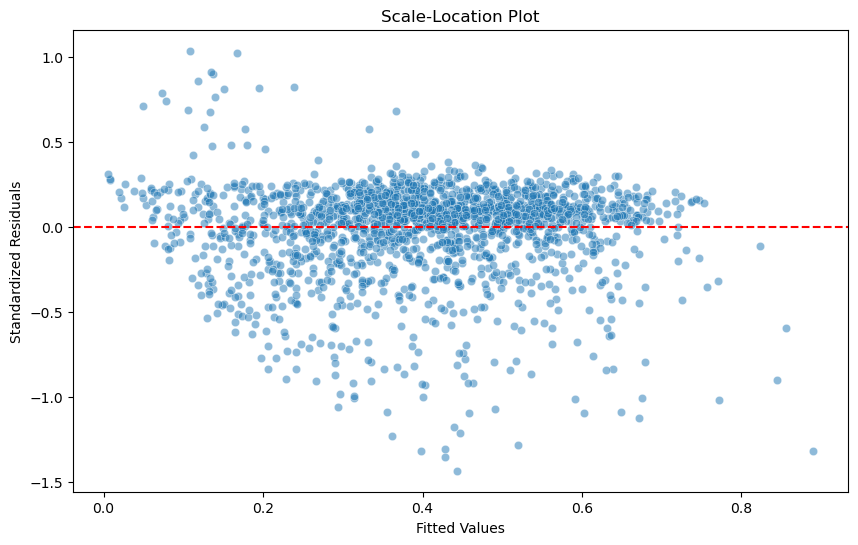

In [70]:
standardized_residuals = residuals_weighted / np.sqrt(wls_model.scale)

# Plot Scale-Location Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=fitted_values_weighted, y=standardized_residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted Values')
plt.ylabel('Standardized Residuals')
plt.title('Scale-Location Plot')
plt.show()

In this analysis, Cook's distance was used to identify influential points in the initial OLS model, which can sometimes skew results and lead to poor model performance. While it's generally not recommended to remove influential points from the test dataset, doing so can be necessary in certain situations where these points significantly affect the model's accuracy and interpretation. By eliminating these outliers, the model can provide a more reliable representation of the underlying relationships in the data, leading to improved performance metrics such as lower MSE and MAE and a higher R-squared value. After removing these influential points, the model was re-evaluated, showing improved performance metrics:

Test MSE: 0.0034,
Test MAE: 0.0406 and
Test R-squared: 0.8527

The fit of the model improved significantly, indicating a strong correlation between actual and predicted values. The model is now better at predicting outcomes without the distortion caused by the influential points.

Test MSE: 0.0034
Test MAE: 0.0406
Test R-squared: 0.8527


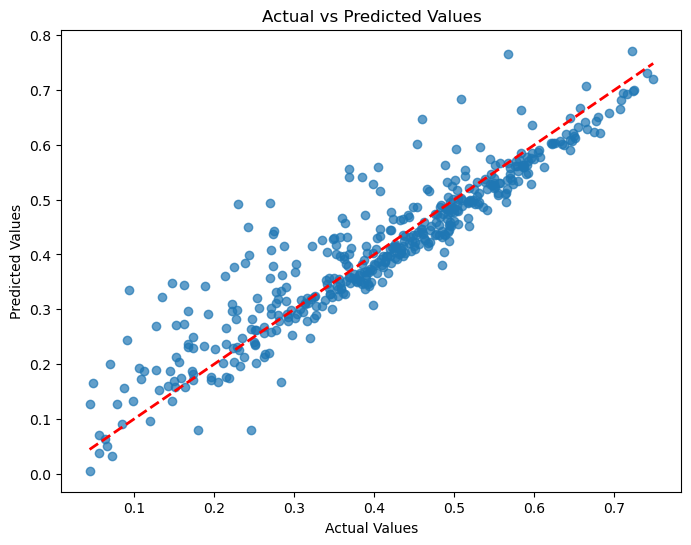

In [71]:
initial_model_train = sm.OLS(y_test, X_test).fit()

# Get Cook's distance
influence = initial_model_train.get_influence()
cooks_d = influence.cooks_distance[0]

# Identify influential points based on Cook's distance
influential_indices = np.where(cooks_d > (1/ len(cooks_d)))[0]

# Remove influential points from training data
X_test = X_test.drop(index=influential_indices)
y_test = y_test.drop(index=influential_indices)



y_pred = wls_model.predict(X_test)

# Calculate performance metrics

mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Test MSE: {mse:.4f}")
print(f"Test MAE: {mae:.4f}")
print(f"Test R-squared: {r2:.4f}")

# Plot actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()


## Predicting area changes: inverse transformations for area_2023 based on WLS regression model
In this analysis, the model was used to predict area_2023 based on the features area_2021, growth_2019_2021, and diff_2019_2021, leveraging the strong performance of the previous WLS regression model. To make predictions, the new data (X_new) was prepared by adding a constant and using the fitted model to generate predictions (y_pred_new).

In [72]:
X_new = test[['area_2021', 'diff_2019_2021', 'growth_2019_2021']]
X_new = sm.add_constant(X_new)
y_pred_new = wls_model.predict(X_new)

Since the original model's target variable was area_2021, inverse transformations were performed to convert the predicted values back to their original scale. This involved:

Min-Max Scaling: Using the minimum and maximum values from the MinMaxScaler to revert the scaling for y_pred_new.

Standard Scaling: Applying the mean and standard deviation from the StandardScaler to revert the standardized values.

Inverse Transformation: Finally, the transformed values were converted back to the original scale using the appropriate power transformation techniques.

This approach ensures that the predictions for area_2023 are in the same scale and context as the original dataset, allowing for meaningful interpretation of the results.


In [73]:
min_val = minmax_scaler.data_min_[3]  # Get min from MinMaxScaler
max_val = minmax_scaler.data_max_[3]  # Get max from MinMaxScaler
mean_val = standard_scaler.mean_[3]  # Get mean from StandardScaler
std_val = standard_scaler.scale_[3]  # Get std from StandardScaler

In [74]:
y_pred_array = y_pred_new.to_numpy().reshape(-1, 1)
y_pred_2 = (y_pred_array* (max_val-min_val))+min_val

# Inverse Standard Scaling for y_pred
y_pred_1=(y_pred_2*std_val)+mean_val
y_pred_2023 = pt2.inverse_transform(y_pred_1)

/opt/anaconda3/envs/MelbourneCityOpenData/lib/python3.8/site-packages/sklearn/base.py:464: UserWarning: X does not have valid feature names, but PowerTransformer was fitted with feature names
  warnings.warn(


## Mapping decreased tree canopy areas from predicted 2023 results

A new dataset was created by copying the original GeoDataFrame and adding the predictions for area_2023. The dataset was then filtered to select rows where area_2023 is less than area_2021. This analysis aims to identify areas that have experienced a decrease in tree canopy, allowing for further examination of tree planting schedules and zones in the City of Melbourne to address canopy loss.


In [75]:
new=gdf.copy()
new['area_2023']=y_pred_2023

In [76]:
new=new.loc[new['area_2023']<new['area_2021']]
new = new.reset_index(drop=True)


The GeoDataFrame containing predictions for area_2023 was enhanced by geocoding the coordinates to obtain location names, latitudes, and longitudes using the Nominatim API. A new column for location names was added to the dataset.

In [77]:
geolocator = Nominatim(user_agent="mygeopy")
loc=[]
latitude=[]
longitude=[]
for i in new['geo_point_2021']:
    lat,lon=i.split(", ")
    latitude.append(float(lat))
    longitude.append(float(lon))
    location = geolocator.reverse((float(lat), float(lon)), language='en',timeout=10)
    address=", ".join(location.address.split(", ")[:-4])
    loc.append(address)



In [78]:
new['location']=loc
new['latitude']=latitude
new['longitude']=longitude
new.head(3)

,geo_point_2018,geo_shape_2018,id_2018,area_2018,geo_point_2019,geo_shape_2019,id_2019,area_2019,geo_point_2021,geo_shape_2021,area_2021,geometry,geo_point_2016,geo_shape_2016,area_2016,area_2023,location,latitude,longitude
0,"-37.84124695622991, 144.98327151968286","{""coordinates"": [[[[144.98331939330936, -37.84...",1213,247.062061,"-37.84124271837534, 144.98327716981257","{""coordinates"": [[[144.983303002, -37.84133850...",111520,209.046848,"-37.841239532163335, 144.98327502632867","{""coordinates"": [[[[144.983297929646, -37.8411...",200.507184,"POLYGON ((322554.69642 5809885.13204, 322554.5...","-37.84124695528669, 144.9832715195055","{""coordinates"": [[[144.98331939313212, -37.841...",247.062061,158.041783,"Pasley Street North, South Yarra, Melbourne",-37.841240,144.983275
1,"-37.84093678707895, 144.98142629806895","{""coordinates"": [[[[144.9814539423438, -37.840...",1245,339.505443,"-37.84093191163414, 144.98143612962346","{""coordinates"": [[[144.98132678650003, -37.840...",111414,337.429686,"-37.84093140991823, 144.9814366640353","{""coordinates"": [[[[144.98139525021838, -37.84...",329.473824,"POLYGON ((322374.44642 5809907.63203, 322374.3...","-37.840936786135785, 144.98142629789027","{""coordinates"": [[[144.98145394216525, -37.840...",339.505443,209.054604,"Armadale Street, Melbourne",-37.840931,144.981437
2,"-37.83034746935204, 144.90367402224626","{""coordinates"": [[[[144.90366091680028, -37.83...",5684,133.154440,"-37.830348694685895, 144.9036853294421","{""coordinates"": [[[144.90372053240003, -37.830...",103188,129.249992,"-37.83035301921699, 144.9036790627309","{""coordinates"": [[[[144.9036454464987, -37.830...",124.071432,"MULTIPOLYGON (((315514.40840 5810943.10200, 31...","-37.83034746840935, 144.90367402200675","{""coordinates"": [[[144.9036609165608, -37.8302...",133.154440,122.075734,"Boeing Aerostructures Australia, 224-260, Lori...",-37.830353,144.903679


A folium map was created to visualize tree canopy data from 2018, 2019, and 2021, with layers colored blue, green, and red, respectively. The map is centered around the average latitude and longitude of selected areas and includes markers indicating locations with predicted decreased tree canopy in 2023. This visual representation aids in identifying areas that may need attention for tree planting and restoration efforts in the City of Melbourne.

In [97]:
#Creating simplified geometries in temporary variable for smaller sized map files.
p=gdf_2018.copy()
q=gdf_2019.copy()
r=gdf_2021.copy()
p['geometry_2018'] = p['geometry_2018'].simplify(tolerance=0.0001, preserve_topology=True)
q['geometry_2019'] = q['geometry_2019'].simplify(tolerance=0.0001, preserve_topology=True)
r['geometry_2021'] = r['geometry_2021'].simplify(tolerance=0.0001, preserve_topology=True)


In [98]:
e = folium.Map(location=[new['latitude'].mean(),new['longitude'].mean()], zoom_start=12)  # Adjust latitude and longitude to your area

# Function to add GeoDataFrames to the map
def add_geo_to_map(gdf, color, year, id):
    geo_json = folium.GeoJson(
        gdf,
        name=year,
        style_function=lambda feature: {
            'fillColor': color,
            'color': color,
            'weight': 1,
            'fillOpacity': 0.5,
        },
        popup=folium.GeoJsonPopup(fields=[id], aliases=[f'{year} ID:']),
        # Tooltip shows ID when hovering over the shape
        tooltip=folium.GeoJsonTooltip(fields=[id], aliases=[f'{year} ID:'])
    ).add_to(e)



# Add each GeoDataFrame to the map with different colors
add_geo_to_map(p, 'blue', '2018', 'objectid')
add_geo_to_map(q, 'green', '2019', 'id')
add_geo_to_map(r, 'red', '2021', 'geo_point_2d')

# Add a layer control to toggle the layers on/off
folium.LayerControl().add_to(e)


for index, row in new.iterrows():

    folium.Marker([row['latitude'], row['longitude']], popup=row['location'],icon=folium.Icon(icon='tree', prefix='fa', color='green'),icon_size=(3, 3)).add_to(e)

    
legend_html = """
        <div style="position: fixed; 
                    bottom: 50px; left: 50px; width: 150px; height: 90px; 
                    border:2px solid grey; z-index:9999; font-size:14px;
                    background-color:white; opacity: 0.8;">
              <p style="text-align:center; margin: 0;"><strong>Legend</strong></p>
              <p style="margin: 0;">Area 2018: <span style="color:blue">&#9679;</span></p>
              <p style="margin: 0;">Area 2019: <span style="color:green">&#9679;</span></p>
              <p style="margin: 0;">Area 2021: <span style="color:red">&#9679;</span></p>
        </div>
        """
        
e.get_root().html.add_child(folium.Element(legend_html))
        
title_html = """
    <h3 style="text-align: center; margin: 10px 0;">Areas with predicted decrease in tree canopy coverage in 2023</h3>
        """
e.get_root().html.add_child(folium.Element(title_html))



e.save("Areas_with_predicted_decrease_in_tree_canopy_coverage_in_2023.html")


Link to the above map: [Areas with predicted decrease in tree canopy coverage in 2023](Areas_with_predicted_decrease_in_tree_canopy_coverage_in_2023.html)

## Analyzing tree planting schedules: zones dataset integration

In [99]:
zones.head()

,geo_point_2d,geo_shape,str_from,segpart,statusid,segid,streetname,streetid,schedule,mapstatus,str_to,segdescr
0,"-37.8030612625994, 144.96879535330316","{""coordinates"": [[[[144.969387175266, -37.8029...",NaN,NaN,NaN,21556,NaN,NaN,Not determined by precinct plan,NaN,NaN,Pelham Street between Rathdowne Street and Dru...
1,"-37.81979235869452, 144.9675112730786","{""coordinates"": [[[[144.96828098035, -37.81969...",NaN,NaN,NaN,22067,NaN,NaN,Years 8 - 10,NaN,NaN,Riverside Avenue between St Kilda Road and Sou...
2,"-37.796602429685905, 144.96990674715127","{""coordinates"": [[[[144.969341164027, -37.7965...",NaN,NaN,NaN,20697,NaN,NaN,Years 5 - 7,NaN,NaN,Little Palmerston Street between Rathdowne Str...
3,"-37.79774465832566, 144.9502620746376","{""coordinates"": [[[[144.950283591209, -37.7975...",NaN,NaN,NaN,21195,NaN,NaN,Complete,NaN,NaN,Chapman Street between Errol Street and Harker...
4,"-37.81652483951976, 144.9864951838192","{""coordinates"": [[[[144.986101797552, -37.8163...",NaN,NaN,NaN,21945,NaN,NaN,Not determined by precinct plan,NaN,NaN,Wellington Parade between Simpson Street and P...


The zones dataset is inspected for its structure and missing values, and columns with null values are dropped.
The value counts of the 'schedule' column are analyzed to understand the distribution of planting schedules.

In [100]:
zones.shape

(839, 12)

In [101]:
zones.isna().sum()

geo_point_2d      0
geo_shape         0
str_from        839
segpart         839
statusid        839
segid             0
streetname      839
streetid        839
schedule          0
mapstatus       839
str_to          839
segdescr          0
dtype: int64

In [79]:
zones.dropna(axis=1,inplace=True)

In [80]:
zones['schedule'].value_counts()

schedule
Years 5 - 7                        223
Years 8 - 10                       219
Complete                           200
Not determined by precinct plan    177
Years 1 - 4                         20
Name: count, dtype: int64

Using the Nominatim API, the latitude and longitude of each zone are extracted from the 'geo_point_2d' column.
The reverse geocoding process generates human-readable location names, which are added to the zones dataset.

In [81]:
geolocator = Nominatim(user_agent="mygeopy")
j=0
latitude=[]
longitude=[]
loc=[]
for i in zones['geo_point_2d']:
    lat,lon=i.split(", ")
    location = geolocator.reverse((float(lat), float(lon)), language='en',timeout=10)
    latitude.append(float(lat))
    longitude.append(float(lon))
    address=", ".join(location.address.split(", ")[:-4])
    loc.append(address)


In [82]:
zones['latitude']=latitude
zones['longitude']=longitude
zones['location']=loc

Geometry objects are created for the 2021 canopy areas in the new dataset and the zones dataset, using the geo_shape column to facilitate spatial analysis.

In [83]:
new['geometry_2021'] = new['geo_shape_2021'].apply(lambda x: shape(eval(x)))
new.head(3)

,geo_point_2018,geo_shape_2018,id_2018,area_2018,geo_point_2019,geo_shape_2019,id_2019,area_2019,geo_point_2021,geo_shape_2021,area_2021,geometry,geo_point_2016,geo_shape_2016,area_2016,area_2023,location,latitude,longitude,geometry_2021
0,"-37.84124695622991, 144.98327151968286","{""coordinates"": [[[[144.98331939330936, -37.84...",1213,247.062061,"-37.84124271837534, 144.98327716981257","{""coordinates"": [[[144.983303002, -37.84133850...",111520,209.046848,"-37.841239532163335, 144.98327502632867","{""coordinates"": [[[[144.983297929646, -37.8411...",200.507184,"POLYGON ((322554.69642 5809885.13204, 322554.5...","-37.84124695528669, 144.9832715195055","{""coordinates"": [[[144.98331939313212, -37.841...",247.062061,158.041783,"Pasley Street North, South Yarra, Melbourne",-37.841240,144.983275,MULTIPOLYGON (((144.983297929646 -37.841167901...
1,"-37.84093678707895, 144.98142629806895","{""coordinates"": [[[[144.9814539423438, -37.840...",1245,339.505443,"-37.84093191163414, 144.98143612962346","{""coordinates"": [[[144.98132678650003, -37.840...",111414,337.429686,"-37.84093140991823, 144.9814366640353","{""coordinates"": [[[[144.98139525021838, -37.84...",329.473824,"POLYGON ((322374.44642 5809907.63203, 322374.3...","-37.840936786135785, 144.98142629789027","{""coordinates"": [[[144.98145394216525, -37.840...",339.505443,209.054604,"Armadale Street, Melbourne",-37.840931,144.981437,MULTIPOLYGON (((144.9813952502184 -37.84083249...
2,"-37.83034746935204, 144.90367402224626","{""coordinates"": [[[[144.90366091680028, -37.83...",5684,133.154440,"-37.830348694685895, 144.9036853294421","{""coordinates"": [[[144.90372053240003, -37.830...",103188,129.249992,"-37.83035301921699, 144.9036790627309","{""coordinates"": [[[[144.9036454464987, -37.830...",124.071432,"MULTIPOLYGON (((315514.40840 5810943.10200, 31...","-37.83034746840935, 144.90367402200675","{""coordinates"": [[[144.9036609165608, -37.8302...",133.154440,122.075734,"Boeing Aerostructures Australia, 224-260, Lori...",-37.830353,144.903679,MULTIPOLYGON (((144.9036454464987 -37.83028169...


The zones dataset is filtered based on the planting schedule into categories: short (Years 1-4), medium (Years 5-7), long (Years 8-10), complete, and not determined.
Each filtered subset is converted to a GeoDataFrame with a defined coordinate reference system (CRS) of EPSG:4326.

In [84]:
zones['geometry'] = zones['geo_shape'].apply(lambda x: shape(eval(x)))
short=zones.loc[zones['schedule']=='Years 1 - 4']
medium=zones.loc[zones['schedule']=='Years 5 - 7']
long=zones.loc[zones['schedule']=='Years 8 - 10']
complete=zones.loc[zones['schedule']=='Complete']
nd=zones.loc[zones['schedule']=='Not determined by precinct plan']
short = gpd.GeoDataFrame(short, geometry='geometry')
short.crs='EPSG:4326'
medium = gpd.GeoDataFrame(medium, geometry='geometry')
medium.crs='EPSG:4326'
long = gpd.GeoDataFrame(long, geometry='geometry')
long.crs='EPSG:4326'
complete = gpd.GeoDataFrame(complete, geometry='geometry')
complete.crs='EPSG:4326'
nd = gpd.GeoDataFrame(nd, geometry='geometry')
nd.crs='EPSG:4326'

A folium map is generated, centered around the average latitude and longitude from the new dataset, providing a visual representation of the planting zones.
The add_geo_to_map function is defined to add each GeoDataFrame to the map with distinct colors representing different planting schedules.Each GeoDataFrame is added to the map with specific colors: yellow for short-term, orange for medium-term, dark red for long-term, green for complete, and purple for not determined.
A layer control feature allows toggling between the different planting schedules on the map.
Markers are added to represent locations in the new dataset, indicating areas with decreased tree canopy, enhancing the map's informative value.

In [108]:
e = folium.Map(location=[new['latitude'].mean(),new['longitude'].mean()], zoom_start=12)  # Adjust latitude and longitude to your area

def add_geo_to_map(gdf, color, n,id):
    geo_json = folium.GeoJson(
        gdf,
        name=n,
        style_function=lambda feature: {
            'fillColor': color,
            'color': color,
            'weight': 1,
            'fillOpacity': 0.5,
        },
        popup=folium.GeoJsonPopup(fields=[id]),
        # Tooltip shows ID when hovering over the shape
        tooltip=folium.GeoJsonTooltip(fields=[id])
    ).add_to(e)



# Add each GeoDataFrame to the map with different colors
add_geo_to_map(short, 'yellow', 'short', 'location')
add_geo_to_map(medium, 'orange','medium', 'location')
add_geo_to_map(long, 'darkred', 'long','location')
add_geo_to_map(complete, 'green','complete', 'location')
add_geo_to_map(nd, 'purple', 'not determined','location')

# Add a layer control to toggle the layers on/off
folium.LayerControl().add_to(e)

for index, row in new.iterrows():

    folium.Marker([row['latitude'], row['longitude']], popup=row['location'],icon=folium.Icon(icon='tree', prefix='fa', color='green'),icon_size=(3, 3)).add_to(e)

    
legend_html = """
        <div style="position: fixed; 
                    bottom: 50px; left: 50px; width: 150px; height: 130px; 
                    border:2px solid grey; z-index:9999; font-size:14px;
                    background-color:white; opacity: 0.8;">
              <p style="text-align:center; margin: 0;"><strong>Legend</strong></p>
              <p style="margin: 0;">Short: <span style="color:yellow">&#9679;</span></p>
              <p style="margin: 0;">Medium: <span style="color:orange">&#9679;</span></p>
              <p style="margin: 0;">Long: <span style="color:darkred">&#9679;</span></p>
              <p style="margin: 0;">Complete: <span style="color:green">&#9679;</span></p>
              <p style="margin: 0;">Not determined: <span style="color:purple">&#9679;</span></p>
        </div>
        """
        
e.get_root().html.add_child(folium.Element(legend_html))
        
title_html = """
    <h3 style="text-align: center; margin: 10px 0;">Tree planting zones and schedules</h3>
        """
e.get_root().html.add_child(folium.Element(title_html))

e

## Analysis of tree canopy loss areas and replanting schedules
The code iterates through the new dataset to classify areas based on their intersection with planting schedules from the zones dataset. A dictionary (schedule_dict) is used to store locations according to their respective schedules.
Areas of 2021 that do not intersect with any planting schedule are tracked in the untouched_ind list. Also records with 'Not determined by precint plan' are also included in untouched_ind list.

In [85]:
schedule_dict={'Years 5 - 7':[],'Years 8 - 10':[],'Years 1 - 4':[],'Complete':[],'Not determined by precinct plan':[]}
untouched_ind=[]

for i,row1 in new.iterrows():
    f=False
    geom1=row1['geometry_2021']
    for j,row2 in zones.iterrows():
        geom2=row2['geometry']

        if geom1.intersects(geom2):
            f=True
            key=row2['schedule']
            schedule_dict[key].append(row2['location'])
            if key=='Not determined by precinct plan':
                untouched_ind.append(i)
            
    if f==False:
        untouched_ind.append(i)
        
        

In [86]:
untouched=new.iloc[untouched_ind,]

A count of the number of locations under each planting schedule is compiled, and a bar chart is created to visualize these counts.
The bar chart distinguishes between the scheduled areas and those overlooked for replanting, using specific colors for each schedule type. 

The findings reveal a concerning result: nearly 500 locations have been overlooked for tree planting, despite experiencing a decrease in tree canopy. Among the scheduled areas, only approximately 60 have completed tree replanting, while around 5 locations have plans for replanting in the immediate 1 to 4-year timeframe. Additionally, 70 areas have replanting schedules planned for the next 5 to 7 years, and 109 areas are slated for replanting in the subsequent 8 to 10 years. These insights underscore the urgent need for action in addressing the overlooked areas to restore tree canopy cover effectively. The data indicates that while some progress is being made, a significant number of locations remain unaddressed, highlighting the importance of prioritizing replanting efforts in areas with declining tree canopy. 

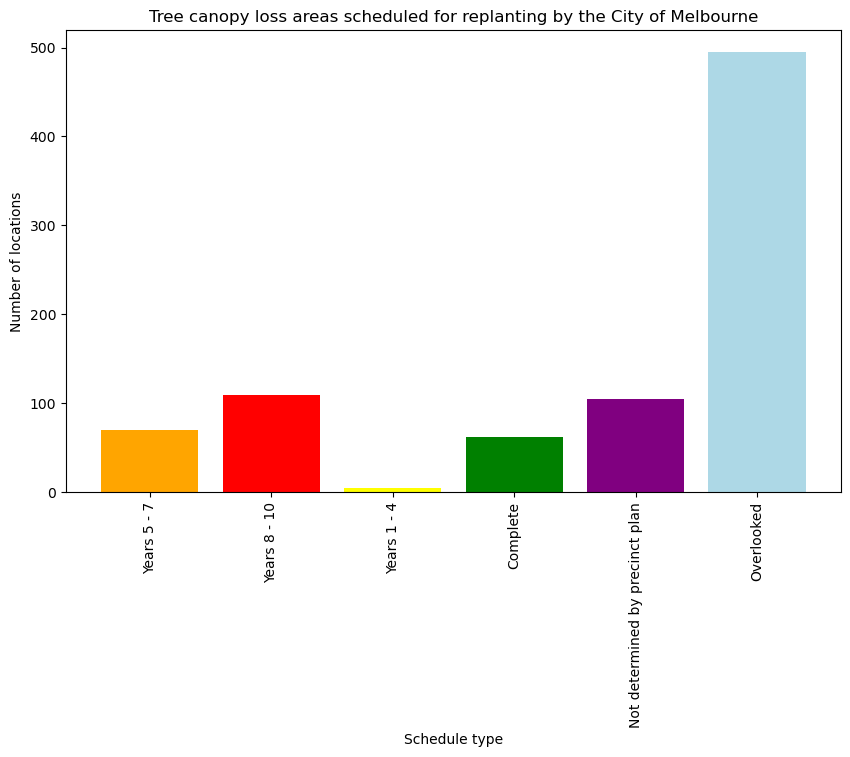

In [111]:
schedule_counts={}
for key,val in schedule_dict.items():
    schedule_counts[key]=len(val)

plt.figure(figsize=(10, 6))
plt.bar(schedule_counts.keys(), schedule_counts.values(), color=['orange', 'red', 'yellow', 'green', 'purple'])
plt.bar('Overlooked', len(untouched), color='lightblue')

plt.xlabel('Schedule type')
plt.ylabel('Number of locations')
plt.title('Tree canopy loss areas scheduled for replanting by the City of Melbourne')
plt.xticks(rotation=90)

plt.show()

The untouched DataFrame is created from the new dataset, highlighting areas that lack scheduled replanting in 2021.
A folium map is generated, centered on the average latitude and longitude of the untouched areas, allowing for visual representation. The add_geo_to_map function is used to add the untouched areas as a red GeoJSON layer to the folium map, indicating where no replanting is planned. Markers are added to the folium map for each location in the untouched DataFrame, visually indicating areas that need attention for tree canopy restoration.

In [87]:
untouched_2021 = gdf_2021.loc[gdf_2021['geo_point_2d'].isin(untouched['geo_point_2021'])]

In [88]:
e = folium.Map(location=[untouched['latitude'].mean(),untouched['longitude'].mean()], zoom_start=12) 

# Function to add GeoDataFrames to the map
def add_geo_to_map(gdf, color, year, id):
    geo_json = folium.GeoJson(
        gdf,
        name=year,
        style_function=lambda feature: {
            'fillColor': color,
            'color': color,
            'weight': 1,
            'fillOpacity': 0.5,
        },
        popup=folium.GeoJsonPopup(fields=[id], aliases=[f'{year} ID:']),
        # Tooltip shows ID when hovering over the shape
        tooltip=folium.GeoJsonTooltip(fields=[id], aliases=[f'{year} ID:'])
    ).add_to(e)


# Add each GeoDataFrame to the map with different colors

add_geo_to_map(untouched_2021, 'red', '2021', 'geo_point_2d')

for index, row in untouched.iterrows():

    folium.Marker([row['latitude'], row['longitude']], popup=row['location'],icon=folium.Icon(icon='tree', prefix='fa', color='green'),icon_size=(3, 3)).add_to(e)

    
legend_html = """
        <div style="position: fixed; 
                    bottom: 50px; left: 50px; width: 150px; height: 30; 
                    border:2px solid grey; z-index:9999; font-size:14px;
                    background-color:white; opacity: 0.8;">
              <p style="text-align:center; margin: 0;"><strong>Legend</strong></p>
              <p style="margin: 0;">Area 2021: <span style="color:red">&#9679;</span></p>

        </div>
        """
        
e.get_root().html.add_child(folium.Element(legend_html))
        
title_html = """
    <h3 style="text-align: center; margin: 10px 0;">Areas in 2021 which lack replanting scheduling plans</h3>
        """
e.get_root().html.add_child(folium.Element(title_html))
e

A dictionary (locations_dict) is constructed to count occurrences of locations in the untouched areas.
A horizontal bar plot is generated to display the top 10 locations with the most tree canopy patches, providing insights into where replanting efforts may be most needed.

In [114]:
locations_dict={}
for loc in untouched['location']:

    if loc not in locations_dict:
        locations_dict[loc]=1
    else:
        locations_dict[loc]+=1

        

The horizontal bar plot displays the top 15 locations with the highest number of untouched tree planting schedules, highlighting areas that require immediate attention for replanting efforts. Notable findings include Royal Parade, Parkville and the University of Melbourne in Parkville, both have the highest count with 13 decreasing canopy patches, followed by Royal Parade, Carlton North with 9. Other significant locations are St Kilda Road (8 patches), Elliott Avenue, Parkville (8 patches), and Royal Park Golf Course (7 patches).

These results underscore the urgency for urban tree canopy restoration in these regions, as they show a significant decline in canopy coverage. The visualization serves to identify priority areas for action, emphasizing the need for focused replanting initiatives to mitigate canopy loss in Melbourne.

In [116]:
top_entries

{'Royal Parade, Parkville, Melbourne': 13,
 'The University of Melbourne, Parkville Campus, Cobden Street, North Melbourne, Melbourne': 13,
 'Royal Parade, Carlton North, Melbourne': 9,
 'Melbourne': 9,
 'St Kilda Road, Melbourne': 8,
 'Elliott Avenue, Parkville, Melbourne': 8,
 'Royal Park Golf Course, The Avenue, Parkville, Melbourne': 7,
 'Orygen Youth Health, 35-37, Poplar Road, Parkville, Melbourne': 6,
 'Main Yarra Trail Capital City Trail, Melbourne': 6,
 'Melbourne Park, Batman Avenue, Melbourne': 6,
 'Royal Botanic Gardens, Alexandra Avenue, Melbourne': 5,
 'Flemington Racecourse, 448, Epsom Road, Flemington, Melbourne': 5,
 'Wellington Parade, Jolimont, East Melbourne, Melbourne': 5,
 'Flemington Road, Parkville, Melbourne': 5,
 'Poplar Road, Parkville, Melbourne': 4}

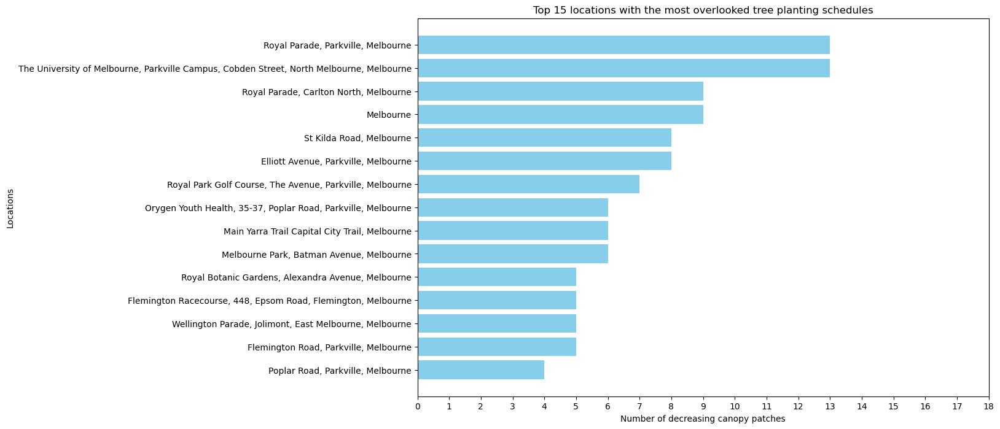

In [115]:
top_entries = dict(sorted(locations_dict.items(), key=lambda item: item[1], reverse=True)[:15])
plt.figure(figsize=(12, 8))
plt.barh(list(top_entries.keys()), list(top_entries.values()), color='skyblue')

plt.xlabel('Number of decreasing canopy patches')
plt.ylabel('Locations')
plt.title('Top 15 locations with the most overlooked tree planting schedules')
plt.xticks(rotation=0)
plt.xticks(range(0, 19))
plt.gca().invert_yaxis()  # To display the highest value at the top
# Show the plot
plt.show()

The analysis revealed that the Weighted Least Squares method with Cook's distance for removing influential points was the most effective, achieving a Test MSE of 0.0034, Test MAE of 0.0406, and a Test R-squared of 0.8527 when predicting 2021 tree canopy loss. Using this model to predict 2023 canopy loss based on 2019 and 2021 data, it was found that nearly 500 locations experiencing canopy decline were overlooked for replanting. Of the scheduled areas, only 60 have completed replanting, with 5 scheduled for the next 1-4 years, 70 for 5-7 years, and 109 for 8-10 years. The results highlight key areas such as Royal Parade in Parkville, The University of Melbourne in Parkville, Royal Parade in Carlton North, St Kilda Road, Elliott Avenue and Royal Park Golf Course in The Avenue where immediate replanting efforts are needed to address canopy loss and restore urban greenery. This emphasizes the need for more focused replanting initiatives in Melbourne.

References:

[SGD indicators](https://data.melbourne.vic.gov.au/explore/dataset/sdg-indicators/custom/)